In [398]:
from nilearn import datasets
dataset = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')
atlas_filename = dataset.maps
labels = dataset.labels

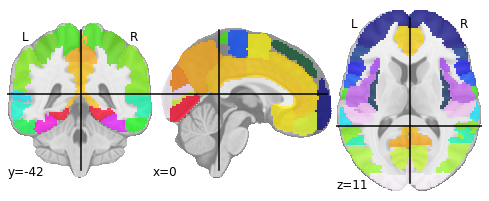

In [399]:
from nilearn import plotting
plotting.plot_roi(atlas_filename)

In [400]:
import nilearn
from nilearn.maskers import NiftiMapsMasker
masker = NiftiMapsMasker(maps_img=atlas_filename, standardize=True)

In [401]:
import pandas as pd
import numpy as np

def load_data(data):
    # Extract the dense_matrix in format numpy without column labels and labels
    my_df = pd.read_csv(data).drop(columns='Unnamed: 0')
    my_labels = list(my_df.columns)
    my_matrix = my_df.to_numpy() 
    return my_matrix, my_labels

In [402]:
from nilearn import datasets
atlas = datasets.fetch_atlas_msdl()
# Loading atlas image stored in 'maps'
atlas_filename = atlas['maps']
# Loading atlas data stored in 'labels'
labels = atlas['labels']

# Load the functional datasets
data = datasets.fetch_development_fmri(n_subjects=1)

print('First subject resting-state nifti image (4D) is located at: %s' %
      data.func[0])

First subject resting-state nifti image (4D) is located at: /Users/mine/nilearn_data/development_fmri/development_fmri/sub-pixar123_task-pixar_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


In [403]:
from nilearn.maskers import NiftiMapsMasker
masker = NiftiMapsMasker(maps_img=atlas_filename, standardize=True,
                         memory='nilearn_cache', verbose=5)
masker.fit(data.func[0])
time_series = masker.transform(data.func[0],
                               confounds=data.confounds)

[NiftiMapsMasker.fit] loading regions from /Users/mine/nilearn_data/msdl_atlas/MSDL_rois/msdl_rois.nii
Resampling maps
[Memory]0.1s, 0.0min    : Loading resample_img...
________________________________________resample_img cache loaded - 0.0s, 0.0min


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/nilearn/_utils/cache_mixin.py:223: UserWarning: memory_level is currently set to 0 but a Memory object has been provided. Setting memory_level to 1.
  warnings.warn("memory_level is currently set to 0 but "


[Memory]0.2s, 0.0min    : Loading _filter_and_extract...
__________________________________filter_and_extract cache loaded - 0.0s, 0.0min


In [404]:
report = masker.generate_report(displayed_maps=[2, 6, 7, 16, 21])
report

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


Parameter,Value
allow_overlap,True
detrend,False
dtype,None
high_pass,None
high_variance_confounds,False
low_pass,None
maps_img,/Users/mine/nilearn_data/msdl_atlas/MSDL_rois/msdl_rois.nii
mask_img,None
memory,Memory(location=nilearn_cache/joblib)
memory_level,1


In [405]:
dense_matrix, my_labels = load_data('diplom/patients/MSDL/sub-OAS30013_ses-d0102_task-rest_run-1_atlas-MSDL.csv')

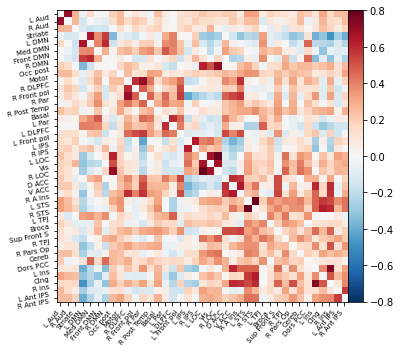

In [406]:
from nilearn.connectome import ConnectivityMeasure
correlation_measure = ConnectivityMeasure(kind='correlation')
correlation_matrix = correlation_measure.fit_transform([time_series])[0]

# Display the correlation matrix
import numpy as np
from nilearn import plotting
# Mask out the major diagonal
np.fill_diagonal(correlation_matrix, 0)
plotting.plot_matrix(correlation_matrix, labels=labels, colorbar=True,
                     vmax=0.8, vmin=-0.8)

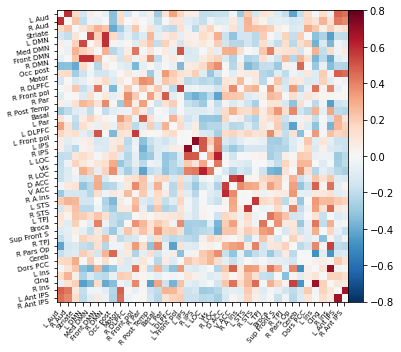

In [407]:
from nilearn.connectome import ConnectivityMeasure
correlation_measure = ConnectivityMeasure(kind='correlation')
my_correlation_matrix = correlation_measure.fit_transform([dense_matrix])[0]

# Display the correlation matrix
import numpy as np
from nilearn import plotting
# Mask out the major diagonal
np.fill_diagonal(my_correlation_matrix, 0)
plotting.plot_matrix(my_correlation_matrix, labels=my_labels, colorbar=True,
                     vmax=0.8, vmin=-0.8)

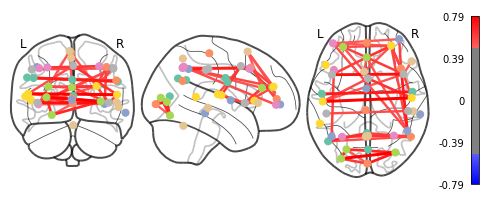

In [408]:
from nilearn import plotting
coords = atlas.region_coords

# We threshold to keep only the 20% of edges with the highest value
# because the graph is very dense
plotting.plot_connectome(correlation_matrix, coords,
                         edge_threshold=0.5, colorbar=True)

plotting.show()

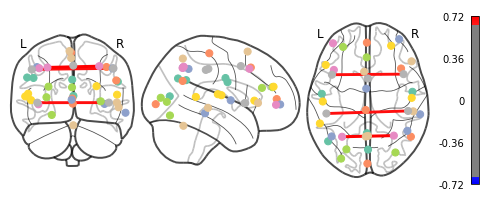

In [409]:
from nilearn import plotting
coords = atlas.region_coords

# We threshold to keep only the 20% of edges with the highest value
# because the graph is very dense
plotting.plot_connectome(my_correlation_matrix, coords,
                         edge_threshold=0.65, colorbar=True)

plotting.show()

In [431]:
from sympy import Matrix, Symbol, Pow, exp, Sum, Integral
from sympy import *

x = Symbol('x')

def to_mx(my_cor):
    l = len(my_cor)
    return Matrix([ [exp(-1*x*abs(my_cor[i][j])) for j in range(l)] for i in range(l)])

def magnitude(my_cor):
    # считаем все корреляции по модулю  .as_poly()
    v = len(my_cor)
    s, r = 0, 0
    thres = np.array([[abs(my_cor[i][j]) > 0 for i in range(v)]
                      for j in range(v)])
    r = sum( sum(thres[i]) for i in range(v))  / 2
    s =  sum( sum(abs(my_cor[i][j]) for i in range(v))
             for j in range(v))  / 4   
    magnitude = v - r + (s/2)*x 
    return magnitude

def spread(mx):
    l = mx.rows
    return sum( Matrix([ sum(mx.row(i))**(-1) for i in range(l) ]) )

In [432]:
def relevant_correlation(my_correlation_matrix, threshold):
    mx = np.round(my_correlation_matrix, 3) 
    l = len(mx)
    thres = [[abs(mx[i][j]) > threshold for i in range(l)] for j in range(l)]
    relevant_cor = [[ mx[i][j] if thres[i][j] else 0 for i in range(l)] for j in range(l)]
    return relevant_cor

In [433]:
relevant_cor  = relevant_correlation(my_correlation_matrix, 0.65)
print(np.array(relevant_cor))

[[0.    0.    0.    ... 0.    0.    0.   ]
 [0.    0.    0.    ... 0.    0.    0.   ]
 [0.    0.    0.    ... 0.    0.    0.   ]
 ...
 [0.    0.    0.    ... 0.    0.    0.   ]
 [0.    0.    0.    ... 0.    0.    0.674]
 [0.    0.    0.    ... 0.    0.674 0.   ]]


In [434]:
v = len(relevant_cor)
thres = np.array([[abs(relevant_cor[i][j]) > 0 for i in range(v)] for j in range(v)])
thres

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False,  True],
       [False, False, False, ..., False,  True, False]])

In [435]:
r = sum( sum(thres[i]) for i in range(v))  / 2
r

3.0

In [436]:
s = sum( sum(abs(relevant_cor[i][j]) for i in range(v)) for j in range(v))  / 4      
s

1.0334999999999999

In [437]:
magni_ = v - r + (s/2)*x 
magni_

0.51675*x + 36.0

In [438]:
from sympy.plotting import plot

def plot_it(setted_matrix):
    ma = magnitude(setted_matrix)
    sp = spread(to_mx(setted_matrix))
    p1 = plot(ma ,(x, 0, 7), show=False)
    p2 = plot(sp, (x, 0, 7), show=False)
    p1.extend(p2)
    p1.show()

In [439]:
def compare_data(data1,data2,threshold):
    
    dense_matrix1, my_labels1 = load_data(data1)
    dense_matrix2, my_labels2 = load_data(data2)
    
    correlation_measure = ConnectivityMeasure(kind='correlation')
    my_correlation_matrix1 = correlation_measure.fit_transform([
        dense_matrix1])[0]
    correlation_measure = ConnectivityMeasure(kind='correlation')
    my_correlation_matrix2 = correlation_measure.fit_transform([
        dense_matrix2])[0]
    
    np.fill_diagonal(my_correlation_matrix1, 0)
    np.fill_diagonal(my_correlation_matrix2, 0)
    
    relevant_cor1 = relevant_correlation(
        my_correlation_matrix1, threshold)
    relevant_cor2 = relevant_correlation(
        my_correlation_matrix2, threshold)
    ma1 = magnitude(my_correlation_matrix1)
    sp1 = spread(to_mx(my_correlation_matrix1))
    ma2 = magnitude(my_correlation_matrix2)
    sp2 = spread(to_mx(my_correlation_matrix2))
    
    p1 = plot(ma1 ,(x, 0, 4), show=False)
    p2 = plot(sp1, (x, 0, 4), show=False)
    p3 = plot(ma2 ,(x, 0, 4), show=False)
    p4 = plot(sp2, (x, 0, 4), show=False)
    p1.append(p2[0])
    p1.append(p3[0])
    p1.append(p4[0])
    p1.show()

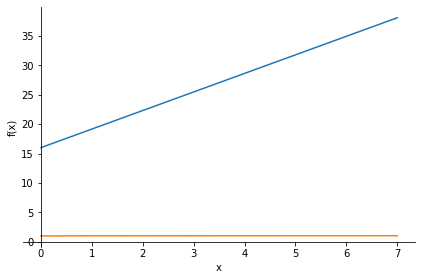

In [440]:
relevant_cor = relevant_correlation(my_correlation_matrix, 0.45)
plot_it(relevant_cor)

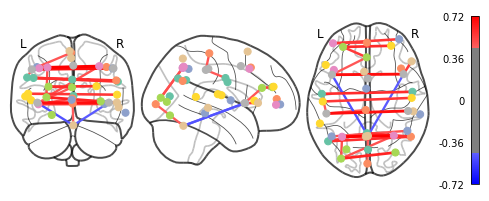

In [441]:
from nilearn import plotting
coords = atlas.region_coords

# We threshold to keep only the 20% of edges with the highest value
# because the graph is very dense
plotting.plot_connectome(my_correlation_matrix, coords,
                         edge_threshold=0.45, colorbar=True)

plotting.show()

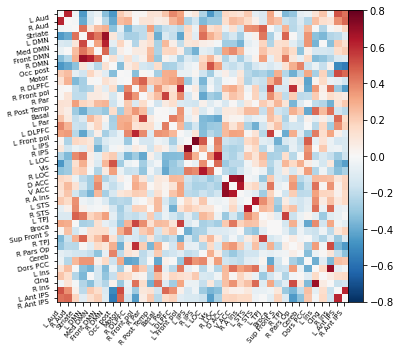

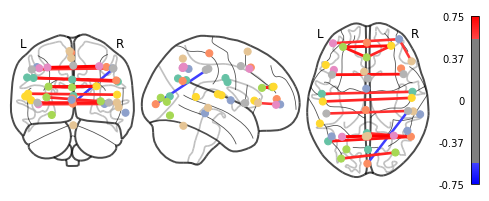

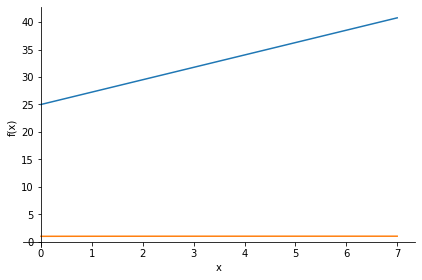

In [442]:
all_inclusive('diplom/patients/MSDL/sub-OAS30013_ses-d0102_task-rest_run-2_atlas-MSDL.csv', threshold=0.55)

In [443]:
from nilearn.connectome import ConnectivityMeasure
from nilearn import plotting
import numpy as np
from nilearn import plotting

def all_inclusive(data, threshold=0.65):
    dense_matrix, my_labels = load_data(data)
    
    correlation_measure = ConnectivityMeasure(kind='correlation')
    my_correlation_matrix = correlation_measure.fit_transform([dense_matrix])[0]
    
    np.fill_diagonal(my_correlation_matrix, 0)
    plotting.plot_matrix(my_correlation_matrix, labels=my_labels, colorbar=True,
                         vmax=0.8, vmin=-0.8)
    coords = atlas.region_coords
    plotting.plot_connectome(my_correlation_matrix, coords,
                             edge_threshold=threshold, colorbar=True)
    plotting.show()
    
    relevant_cor = relevant_correlation(my_correlation_matrix, threshold)
    plot_it(relevant_cor)

def ms_all_inclusive(data, threshold=0.65):
    dense_matrix, my_labels = load_data(data)
    
    correlation_measure = ConnectivityMeasure(kind='correlation')
    my_correlation_matrix = correlation_measure.fit_transform([dense_matrix])[0]
    np.fill_diagonal(my_correlation_matrix, 0)
    plotting.plot_matrix(my_correlation_matrix, labels=my_labels, colorbar=True,
                         vmax=0.8, vmin=-0.8)

    coords = atlas.region_coords
    plotting.plot_connectome(my_correlation_matrix, coords,
                             edge_threshold=threshold, colorbar=True)
    plotting.show()
    
    relevant_cor = relevant_correlation(my_correlation_matrix, threshold)
    plot_it(relevant_cor)
    ma = magnitude(relevant_cor)
    sp = spread(to_mx(relevant_cor))
    return ma, sp

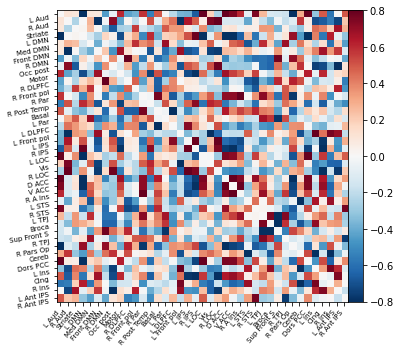

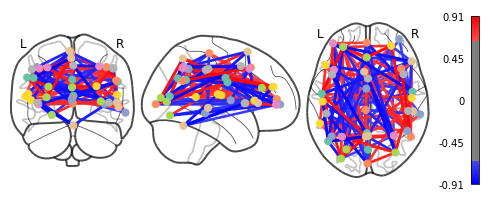

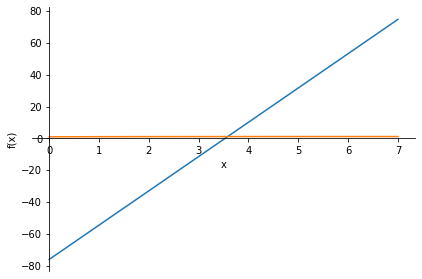

In [444]:
path = 'diplom/patients/MSDL/'
run1 = '_task-rest_run-1_atlas-MSDL.csv'
run2 = '_task-rest_run-2_atlas-MSDL.csv'
run3 = '_task-rest_run-3_atlas-MSDL.csv'

all_inclusive(path+'sub-OAS30016_ses-d0021'+run1, threshold=0.65)

In [445]:
data_ = path+'sub-OAS30016_ses-d0021'+run1
threshold_=0.8

dense_matrix_, my_labels_ = load_data(data_)
dense_matrix_

array([[-7.77541882e-02,  1.86751105e-01, -1.53029854e-01, ...,
        -4.64326116e-02, -2.18728655e-01, -2.53894786e-02],
       [ 4.19655871e-12,  9.95088812e-13,  1.28510790e-12, ...,
         1.14615640e-12, -1.01460333e-12, -5.43854383e-12],
       [ 4.19655871e-12,  2.98526644e-12, -2.57021581e-12, ...,
        -5.73078198e-13, -2.53650834e-12, -6.79817979e-12],
       ...,
       [-3.26239170e-01,  1.14250226e+00, -1.21898545e+00, ...,
        -8.27341217e-01, -1.25750502e+00, -7.23278635e-01],
       [ 8.39311741e-13,  1.99017762e-12,  3.85532371e-12, ...,
         5.73078198e-13, -5.07301667e-13, -7.47799777e-12],
       [ 8.39311741e-13,  0.00000000e+00, -7.71064743e-12, ...,
        -2.86539099e-13, -1.52190500e-12, -9.51745171e-12]])

In [446]:
correlation_measure = ConnectivityMeasure(kind='correlation')
my_correlation_matrix_ = correlation_measure.fit_transform([dense_matrix_])[0]
my_correlation_matrix_

array([[ 1.        ,  0.1012166 ,  0.08915301, ..., -0.57871483,
        -0.00257463,  0.49971988],
       [ 0.1012166 ,  1.        , -0.24365952, ..., -0.55077599,
        -0.73305434,  0.21764519],
       [ 0.08915301, -0.24365952,  1.        , ...,  0.19199885,
         0.66376786,  0.27032723],
       ...,
       [-0.57871483, -0.55077599,  0.19199885, ...,  1.        ,
         0.28675819,  0.0033408 ],
       [-0.00257463, -0.73305434,  0.66376786, ...,  0.28675819,
         1.        , -0.18201212],
       [ 0.49971988,  0.21764519,  0.27032723, ...,  0.0033408 ,
        -0.18201212,  1.        ]])

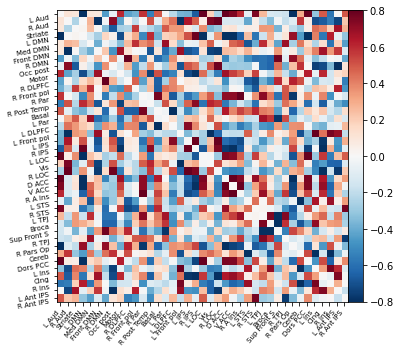

In [447]:
np.fill_diagonal(my_correlation_matrix_, 0)
plotting.plot_matrix(my_correlation_matrix_, labels=my_labels_, colorbar=True,
                         vmax=0.8, vmin=-0.8)

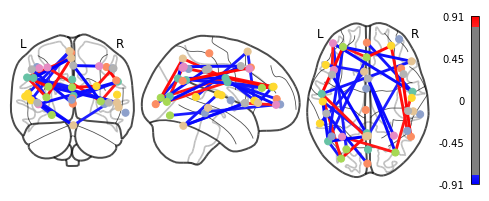

In [448]:
coords = atlas.region_coords
plotting.plot_connectome(my_correlation_matrix_, coords,
                        edge_threshold=0.8, colorbar=True)
plotting.show()

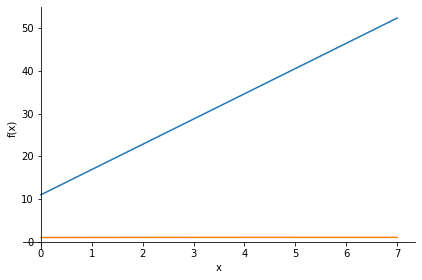

In [449]:
relevant_cor_ = relevant_correlation(my_correlation_matrix_,
                                     threshold_)
plot_it(relevant_cor_)
ma_ = magnitude(relevant_cor_)
sp_ = spread(to_mx(relevant_cor_))

In [450]:
ma_

5.9115*x + 11.0

In [451]:
mx_ = to_mx(relevant_cor_)
np.array(mx_)

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]], dtype=object)

In [452]:
l

60

In [453]:
sp_

4/13 + 1/(34 + exp(-0.907*x) + exp(-0.873*x) + exp(-0.835*x) + exp(-0.823*x) + exp(-0.81*x)) + 1/(35 + exp(-0.881*x) + exp(-0.859*x) + exp(-0.835*x) + exp(-0.809*x)) + 1/(34 + exp(-0.881*x) + exp(-0.873*x) + exp(-0.839*x) + 2*exp(-0.834*x)) + 1/(36 + exp(-0.861*x) + exp(-0.813*x) + exp(-0.804*x)) + 1/(36 + exp(-0.861*x) + exp(-0.835*x) + exp(-0.82*x)) + 1/(36 + exp(-0.864*x) + exp(-0.834*x) + exp(-0.823*x)) + 1/(36 + exp(-0.867*x) + exp(-0.81*x) + exp(-0.809*x)) + 1/(36 + exp(-0.878*x) + exp(-0.825*x) + exp(-0.82*x)) + 1/(36 + exp(-0.907*x) + exp(-0.864*x) + exp(-0.839*x)) + 1/(37 + exp(-0.82*x) + exp(-0.814*x)) + 1/(37 + exp(-0.859*x) + exp(-0.834*x)) + 1/(37 + exp(-0.867*x) + exp(-0.849*x)) + 1/(37 + exp(-0.878*x) + exp(-0.856*x)) + 1/(37 + exp(-0.881*x) + exp(-0.813*x)) + 1/(37 + exp(-0.881*x) + exp(-0.816*x)) + 1/(38 + exp(-0.804*x)) + 1/(38 + exp(-0.814*x)) + 1/(38 + exp(-0.816*x)) + 1/(38 + exp(-0.82*x)) + 1/(38 + exp(-0.825*x)) + 1/(38 + exp(-0.835*x)) + 1/(38 + exp(-0.849*x)) +

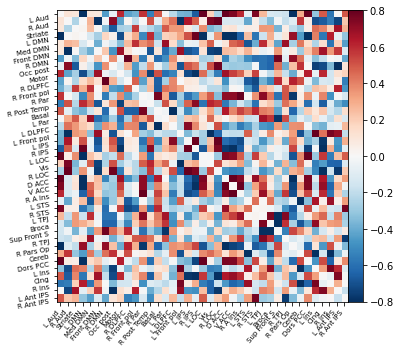

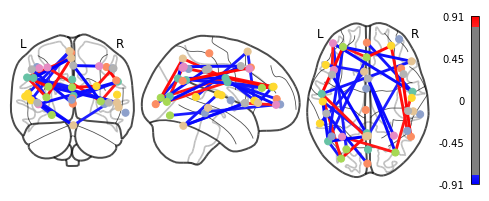

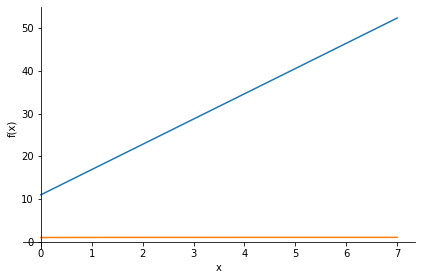

In [454]:
all_inclusive('diplom/patients/MSDL/sub-OAS30016_ses-d0021_task-rest_run-1_atlas-MSDL.csv', threshold=0.80)

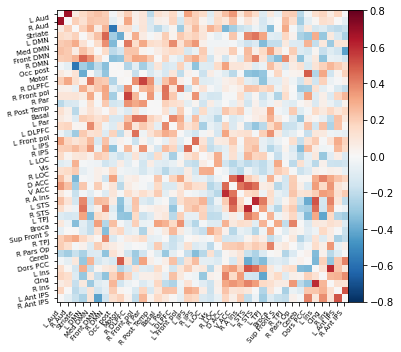

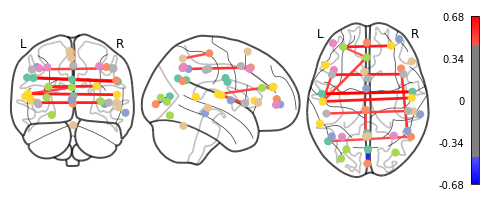

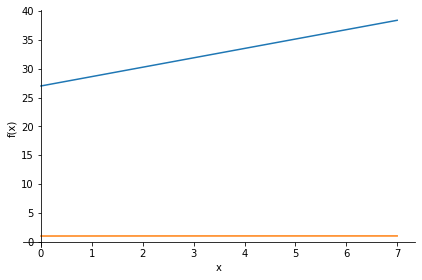

In [455]:
ma, sp = ms_all_inclusive('diplom/patients/MSDL/sub-OAS30027_ses-d1300_task-rest_run-2_atlas-MSDL.csv', threshold=0.45)

In [456]:
print(ma)

1.62575*x + 27.0


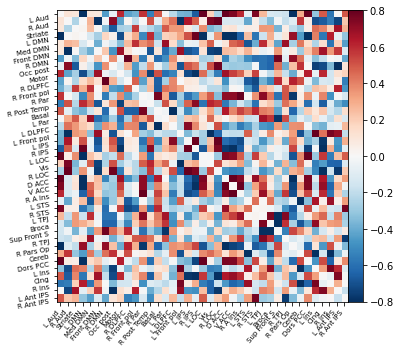

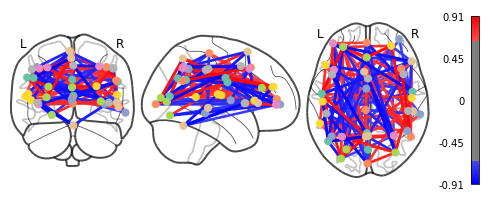

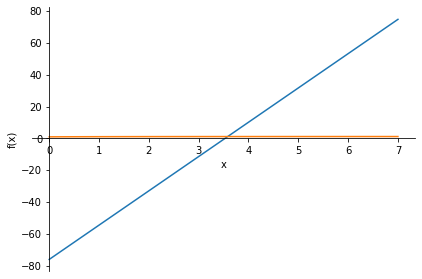

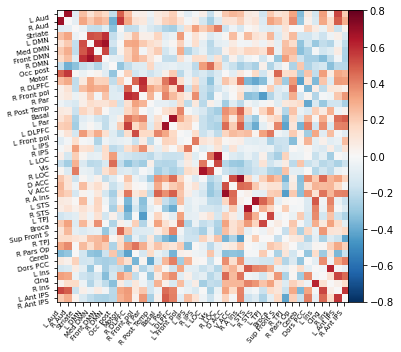

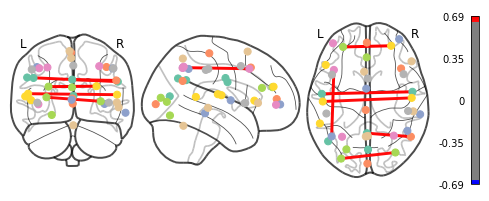

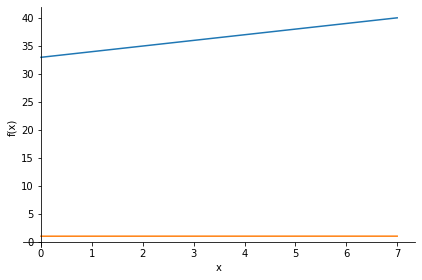

In [457]:
data1 = path+'sub-OAS30016_ses-d0021'+run1
data2 = path+'sub-OAS30027_ses-d2394'+run1

m1,s1 = ms_all_inclusive(data1)
m2, s2 = ms_all_inclusive(data2)

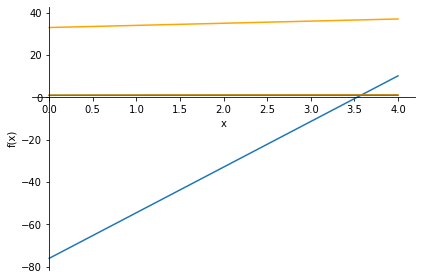

In [458]:
def compare_graph(m,s):
    # четные -- пациенты, нечетные -- контроль
    scale = 4
    p1 = plot(m[0] ,(x, 0, scale), show=False)
    p2 = plot(s[0], (x, 0, scale), show=False)
    p1.append(p2[0])
    for i in range(len(m) - 1):
        if i%2==0: 
            p3 = plot(m[i + 1] ,(x, 0, scale), show=False, 
                     line_color='orange')
            p4 = plot(s[i + 1], (x, 0, scale), show=False,
                     line_color='olive')
            p1.extend(p3)
            p1.extend(p4)
        else:
            p3 = plot(m[i + 1] ,(x, 0, scale), show=False,
                     line_color = 'purple')
            p4 = plot(s[i + 1], (x, 0, scale), show=False,
                     line_color = 'blue')
            p1.extend(p3)
            p1.extend(p4)
    p1.show()
    
compare_graph([m1,m2],[s1,s2])

In [492]:
import pathlib
# определение пути
currentDirectory = pathlib.Path('diplom/patients/MSDL/')
list_patients = []
for currentFile in currentDirectory.iterdir():  
    list_patients.append(currentFile)
    
currentDirectory = pathlib.Path('diplom/controls/MSDL/')
list_controls = []
for currentFile in currentDirectory.iterdir():  
    list_controls.append(currentFile)
    
list_controls[0]

PosixPath('diplom/controls/MSDL/sub-OAS31114_ses-d2644_task-rest_run-2_atlas-MSDL.csv')

In [493]:
str(list_patients[0])

'diplom/patients/MSDL/sub-OAS30650_ses-d1879_task-rest_run-2_atlas-MSDL.csv'

In [494]:
len(list_patients)

793

In [495]:
len(list_controls)

1349

diplom/patients/MSDL/sub-OAS30650_ses-d1879_task-rest_run-2_atlas-MSDL.csv 0


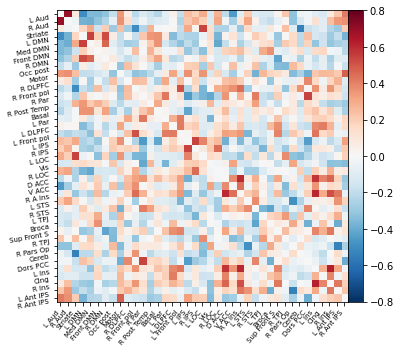

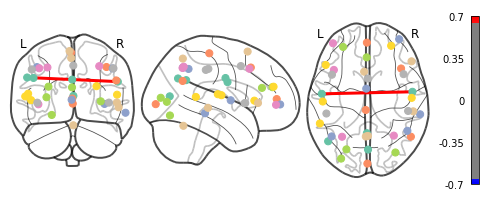

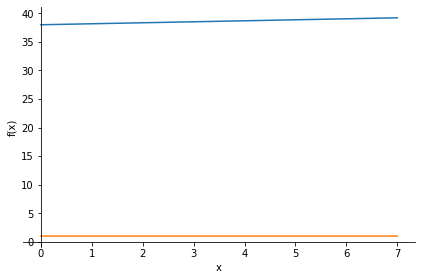

diplom/controls/MSDL/sub-OAS31114_ses-d2644_task-rest_run-2_atlas-MSDL.csv 0


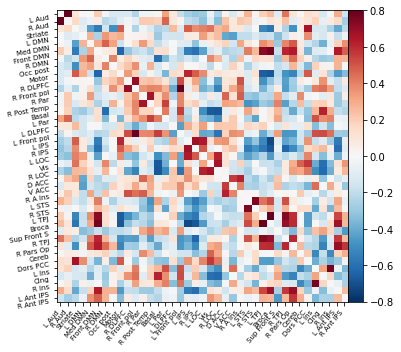

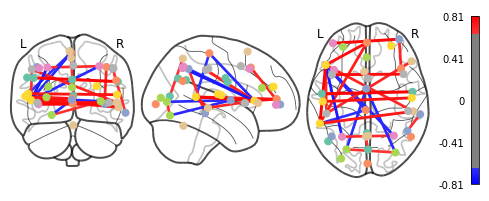

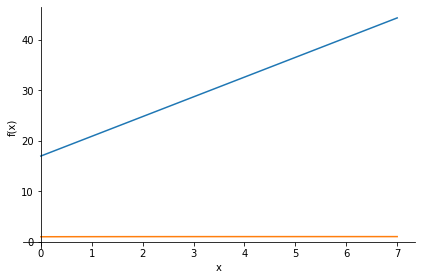

diplom/patients/MSDL/sub-OAS30745_ses-d2863_task-rest_run-1_atlas-MSDL.csv 1


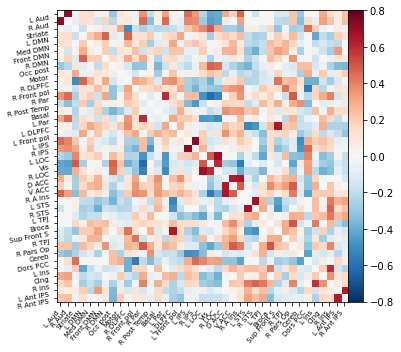

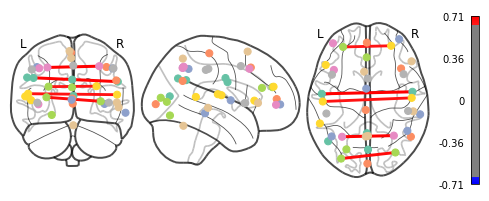

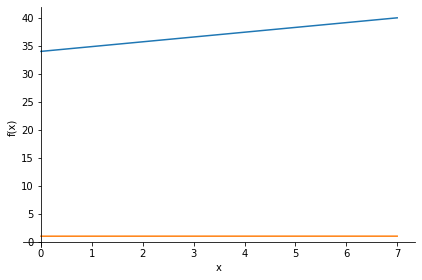

diplom/controls/MSDL/sub-OAS30727_ses-d0126_task-rest_run-2_atlas-MSDL.csv 1


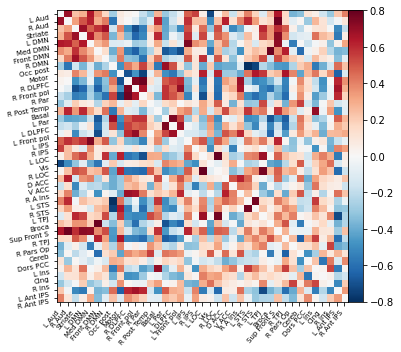

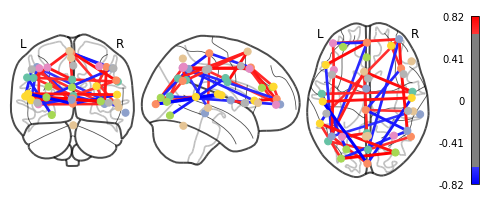

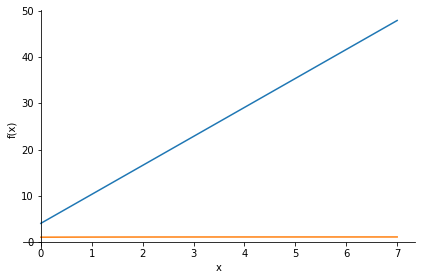

diplom/patients/MSDL/sub-OAS30152_ses-d0111_task-rest_run-1_atlas-MSDL.csv 2


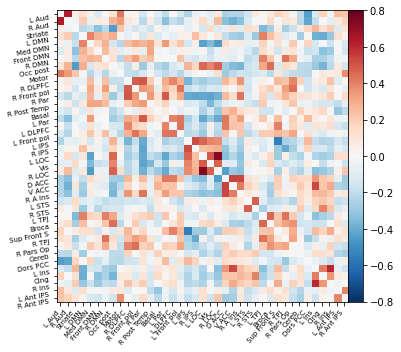

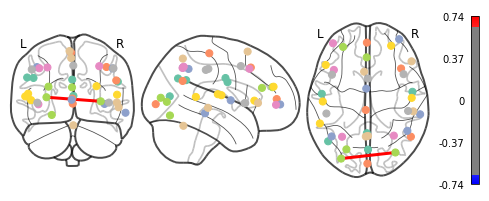

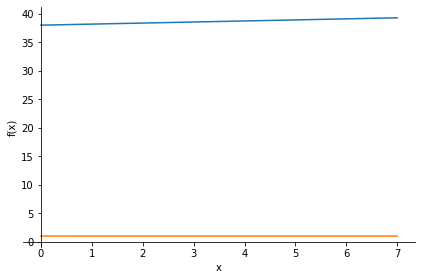

diplom/controls/MSDL/sub-OAS30005_ses-d0581_task-rest_run-3_atlas-MSDL.csv 2


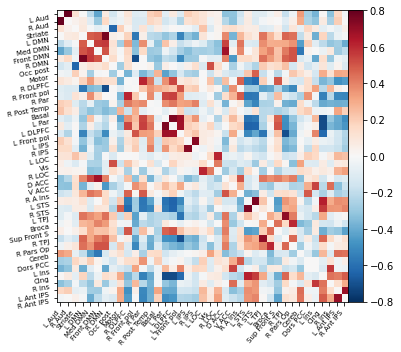

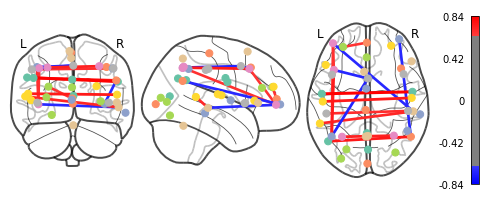

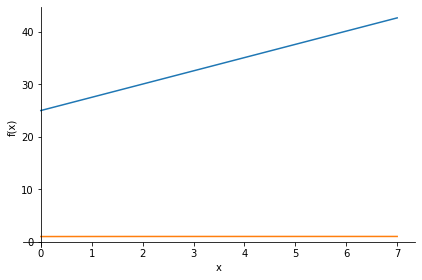

diplom/patients/MSDL/sub-OAS31124_ses-d0436_task-rest_run-1_atlas-MSDL.csv 3


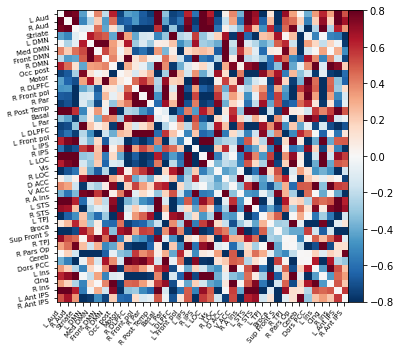

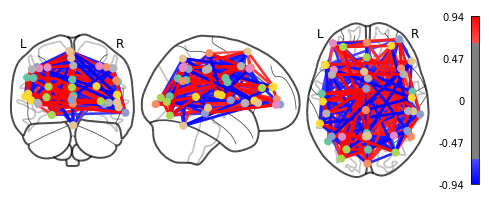

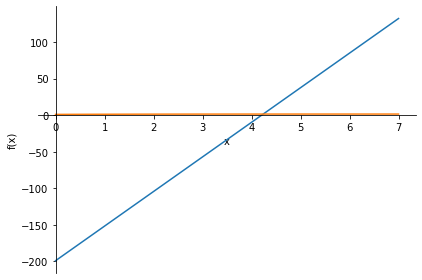

diplom/controls/MSDL/sub-OAS30660_ses-d3464_task-rest_run-2_atlas-MSDL.csv 3


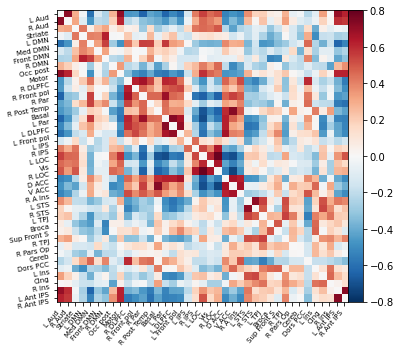

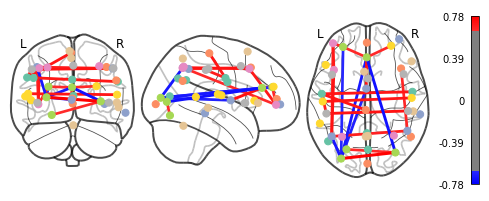

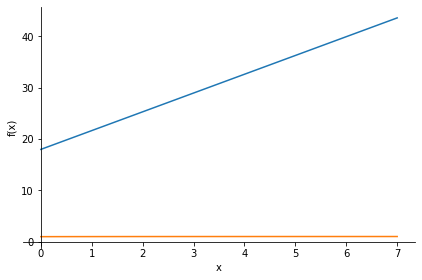

diplom/patients/MSDL/sub-OAS30751_ses-d0063_task-rest_run-1_atlas-MSDL.csv 4


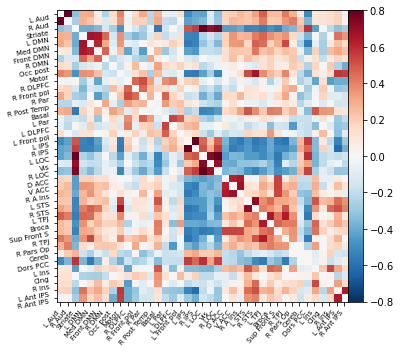

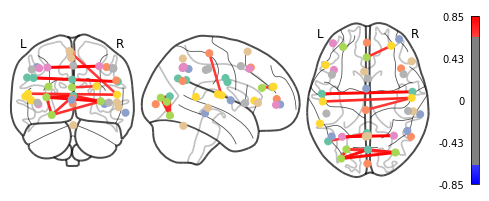

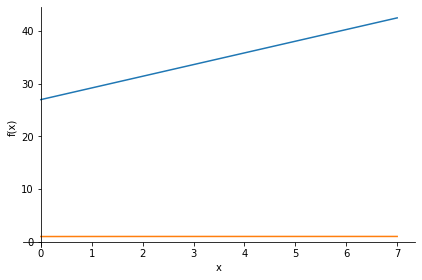

diplom/controls/MSDL/sub-OAS30280_ses-d1647_task-rest_run-2_atlas-MSDL.csv 4


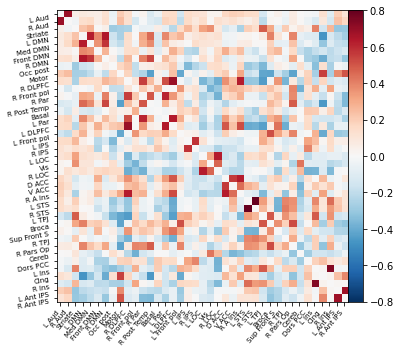

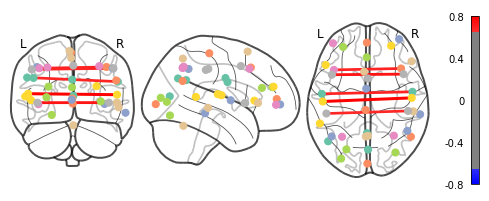

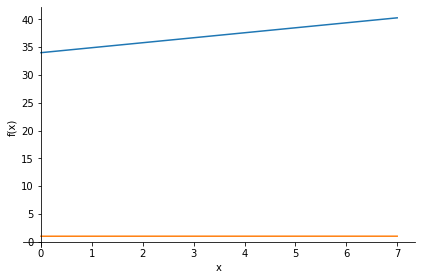

diplom/patients/MSDL/sub-OAS30775_ses-d2381_task-rest_run-1_atlas-MSDL.csv 5


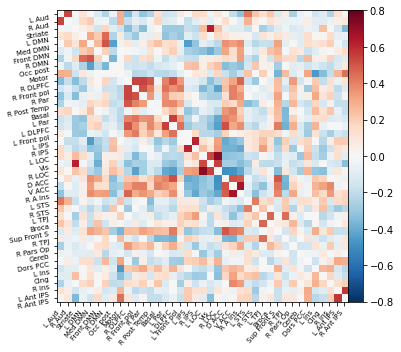

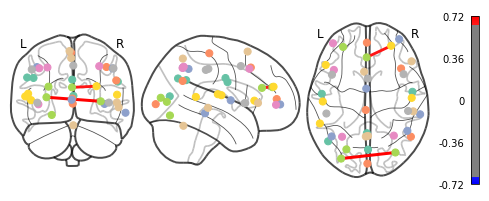

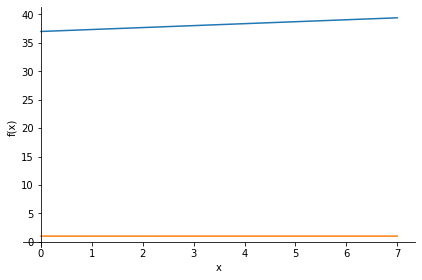

diplom/controls/MSDL/sub-OAS31132_ses-d4297_task-rest_run-1_atlas-MSDL.csv 5


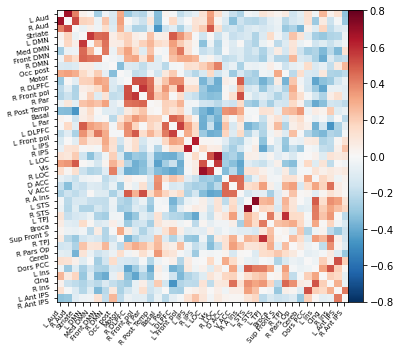

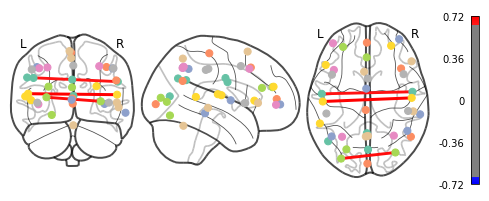

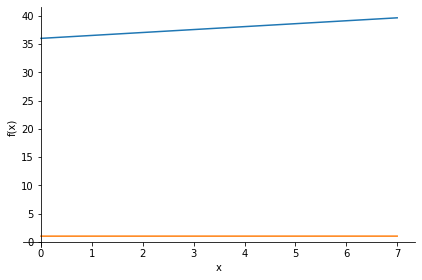

diplom/patients/MSDL/sub-OAS30926_ses-d1520_task-rest_run-2_atlas-MSDL.csv 6


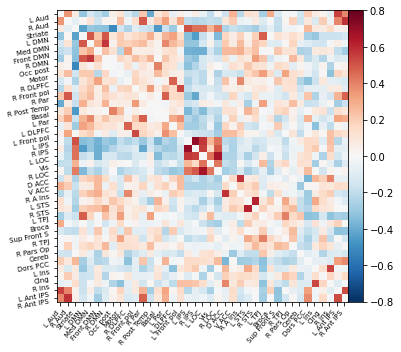

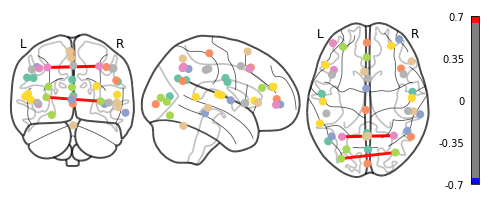

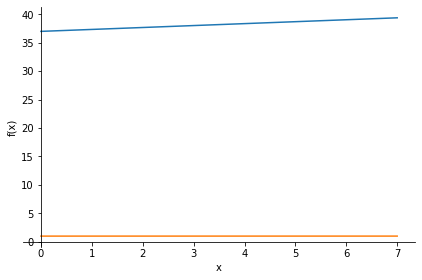

diplom/controls/MSDL/sub-OAS31012_ses-d2449_task-rest_run-2_atlas-MSDL.csv 6


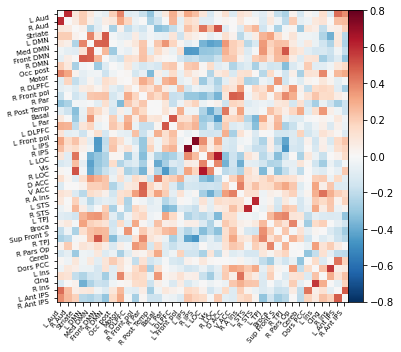

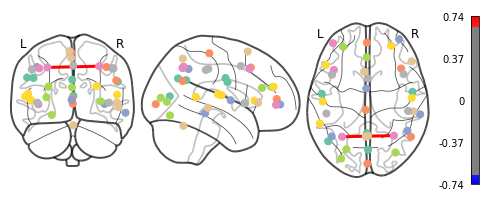

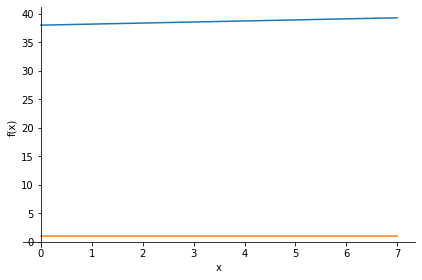

diplom/patients/MSDL/sub-OAS30745_ses-d4282_task-rest_run-1_atlas-MSDL.csv 7


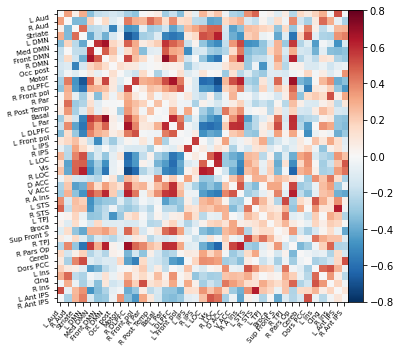

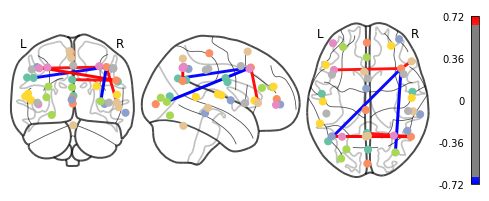

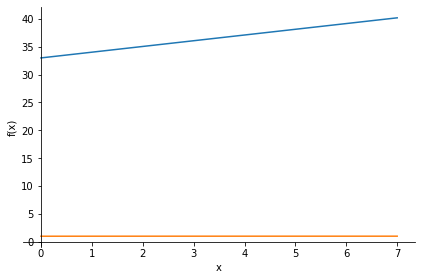

diplom/controls/MSDL/sub-OAS31108_ses-d4795_task-rest_run-2_atlas-MSDL.csv 7


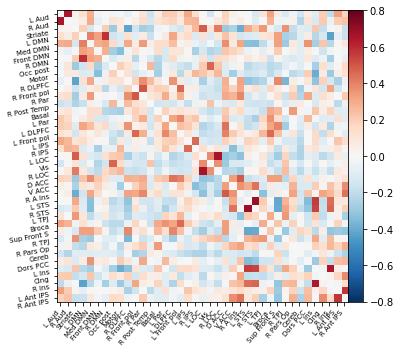

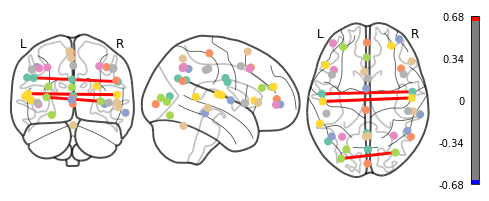

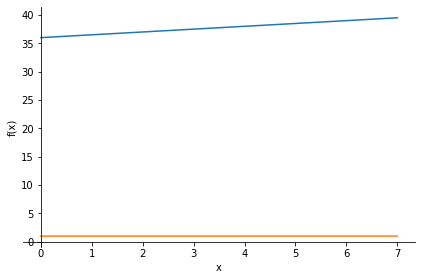

diplom/patients/MSDL/sub-OAS31126_ses-d1156_task-rest_run-2_atlas-MSDL.csv 8


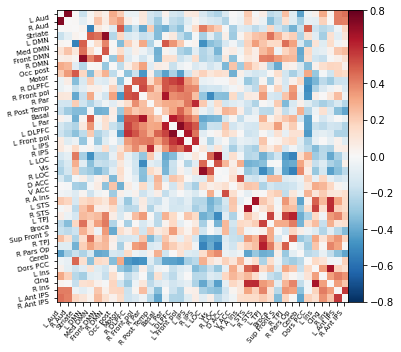

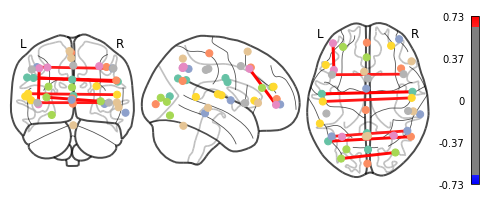

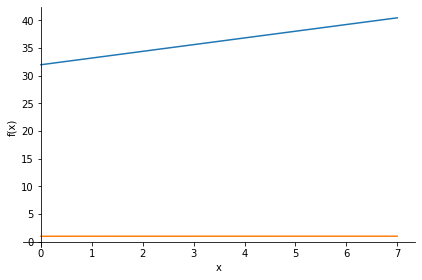

diplom/controls/MSDL/sub-OAS30240_ses-d3483_task-rest_run-1_atlas-MSDL.csv 8


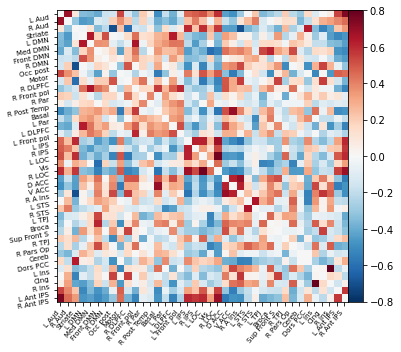

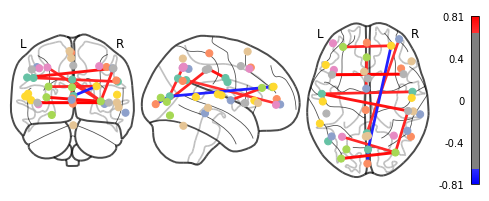

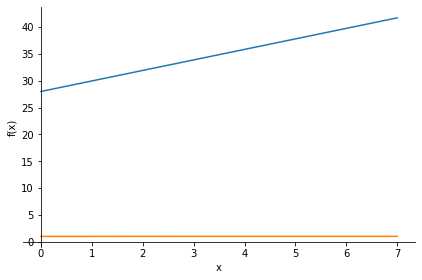

diplom/patients/MSDL/sub-OAS30964_ses-d2772_task-rest_run-1_atlas-MSDL.csv 9


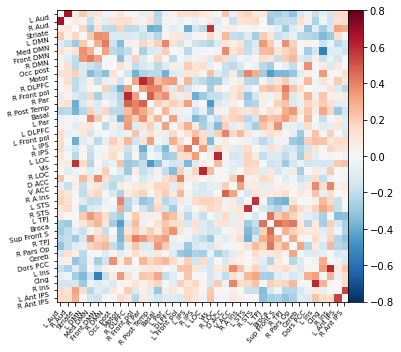

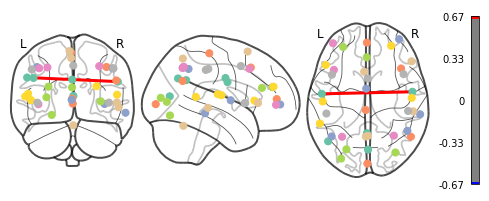

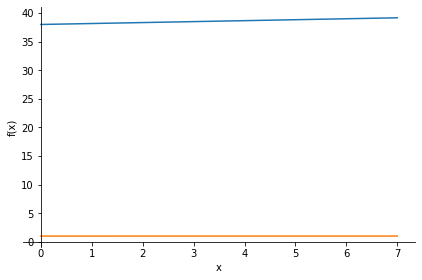

diplom/controls/MSDL/sub-OAS30331_ses-d3478_task-rest_run-1_atlas-MSDL.csv 9


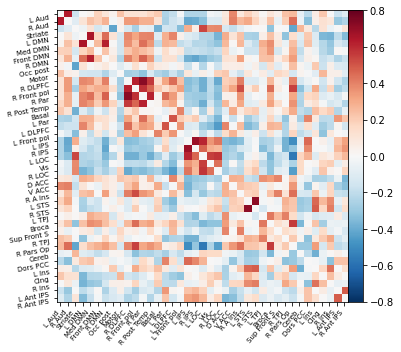

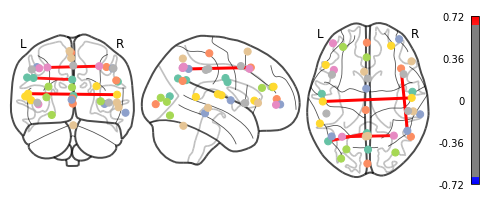

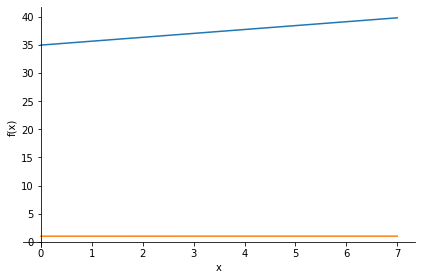

diplom/patients/MSDL/sub-OAS30687_ses-d0064_task-rest_run-1_atlas-MSDL.csv 10


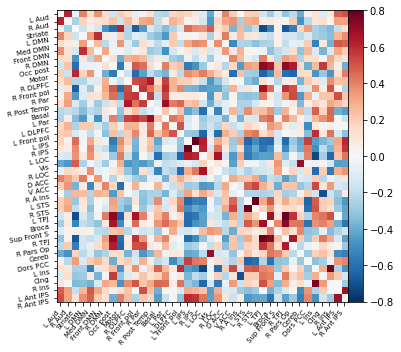

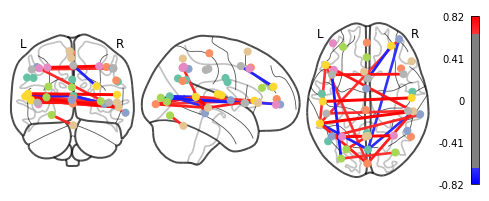

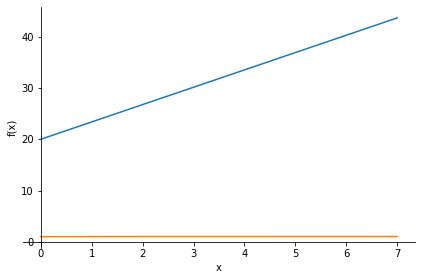

diplom/controls/MSDL/sub-OAS30240_ses-d1871_task-rest_run-1_atlas-MSDL.csv 10


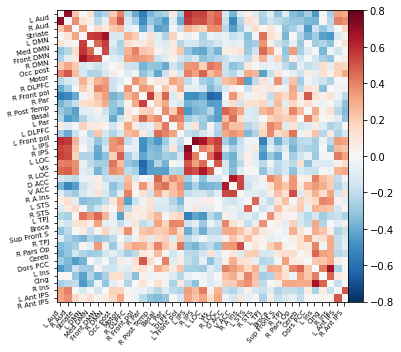

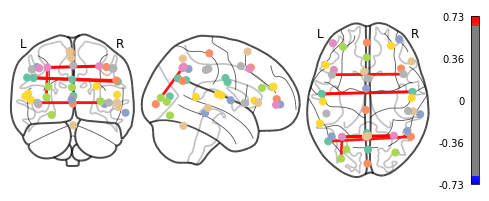

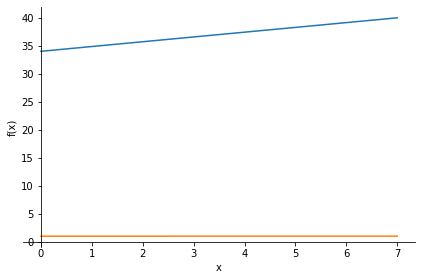

diplom/patients/MSDL/sub-OAS30344_ses-d1052_task-rest_run-1_atlas-MSDL.csv 11


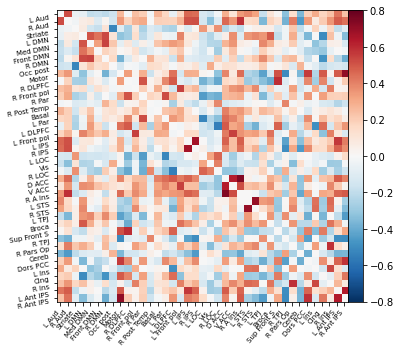

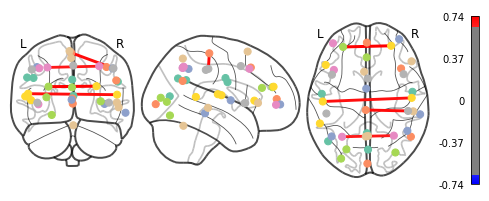

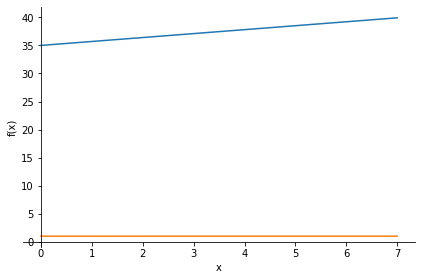

diplom/controls/MSDL/sub-OAS30073_ses-d3670_task-rest_run-2_atlas-MSDL.csv 11


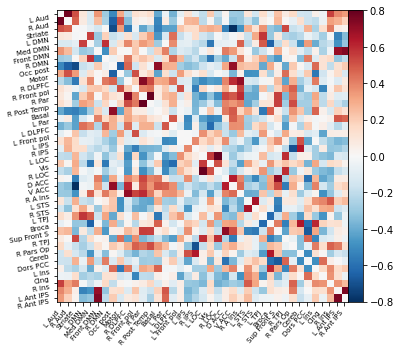

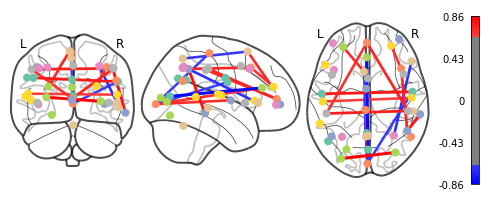

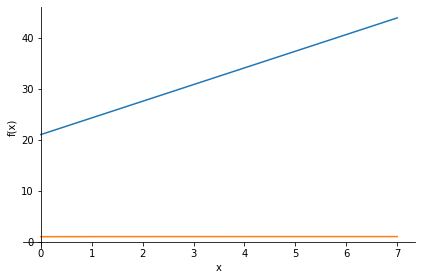

diplom/patients/MSDL/sub-OAS30124_ses-d0046_task-rest_run-1_atlas-MSDL.csv 12


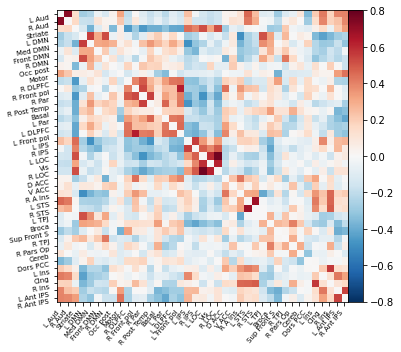

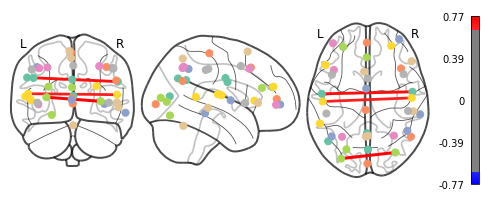

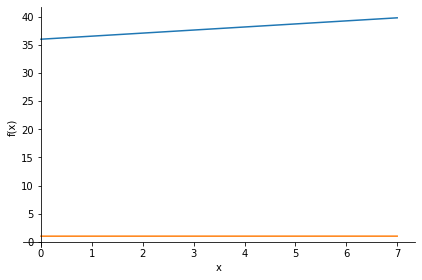

diplom/controls/MSDL/sub-OAS30405_ses-d0079_task-rest_run-1_atlas-MSDL.csv 12


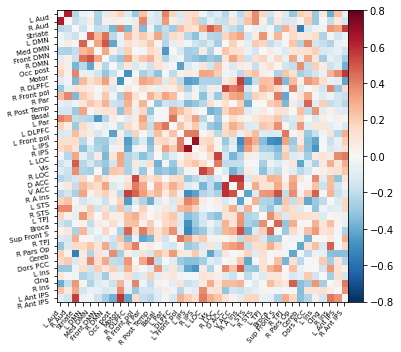

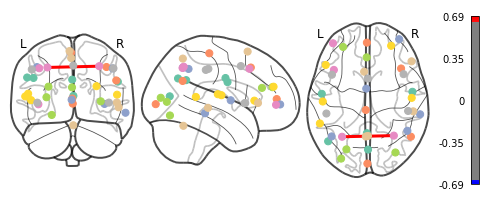

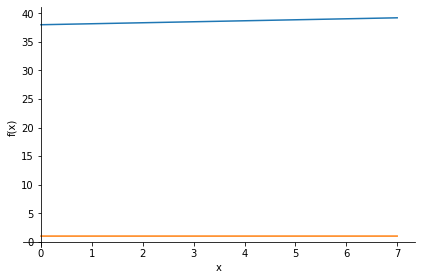

diplom/patients/MSDL/sub-OAS30243_ses-d0034_task-rest_run-1_atlas-MSDL.csv 13


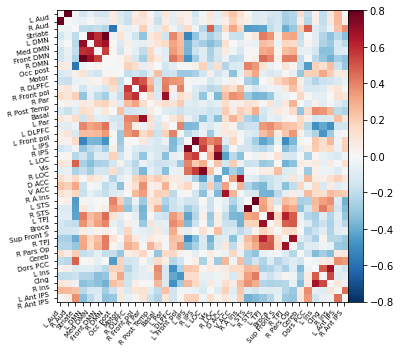

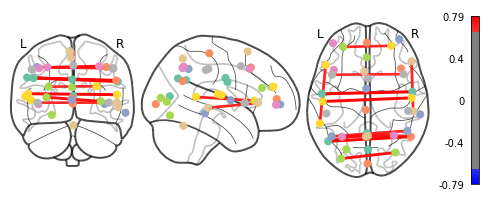

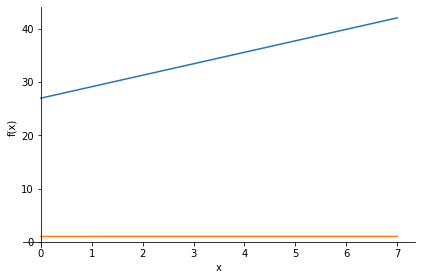

diplom/controls/MSDL/sub-OAS30191_ses-d2352_task-rest_run-2_atlas-MSDL.csv 13


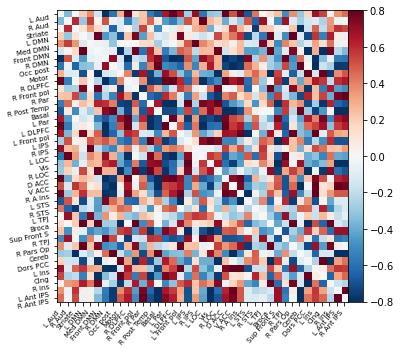

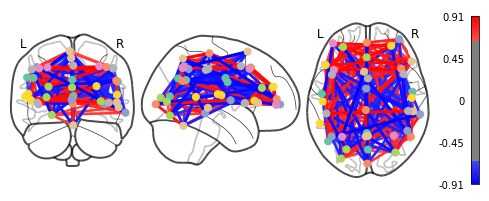

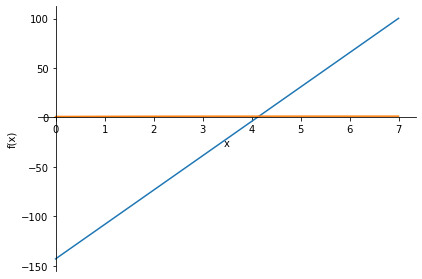

diplom/patients/MSDL/sub-OAS30998_ses-d0051_task-rest_run-2_atlas-MSDL.csv 14


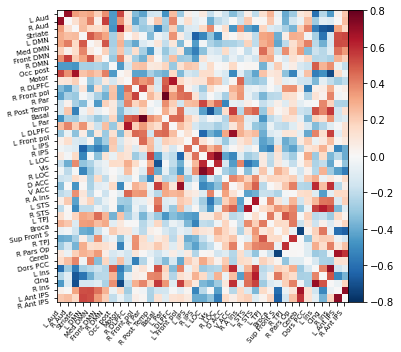

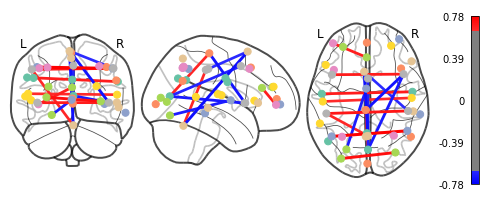

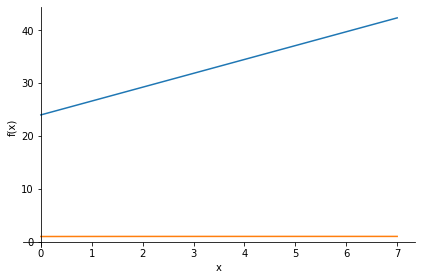

diplom/controls/MSDL/sub-OAS30841_ses-d3499_task-rest_run-2_atlas-MSDL.csv 14


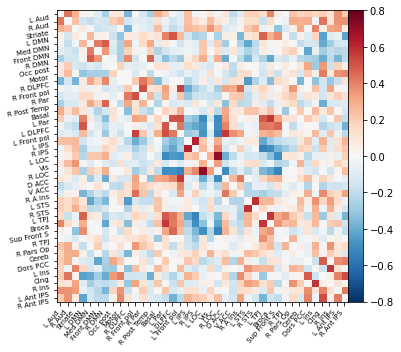

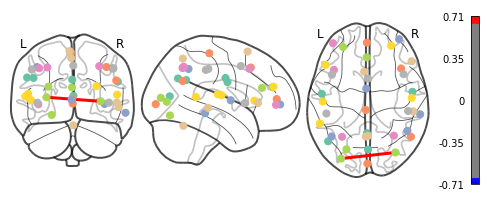

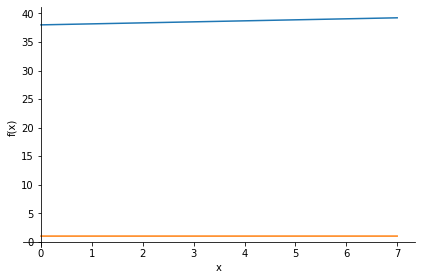

diplom/patients/MSDL/sub-OAS30622_ses-d0802_task-rest_run-1_atlas-MSDL.csv 15


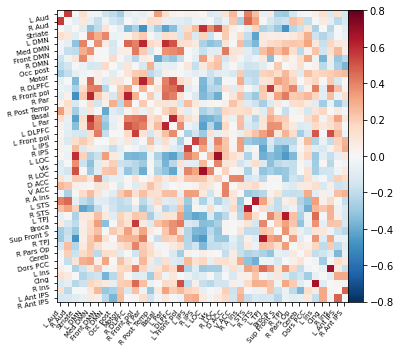

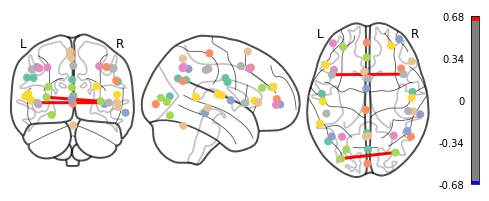

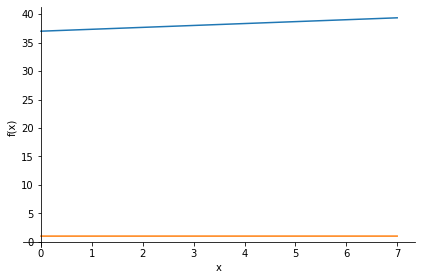

diplom/controls/MSDL/sub-OAS31009_ses-d3611_task-rest_run-1_atlas-MSDL.csv 15


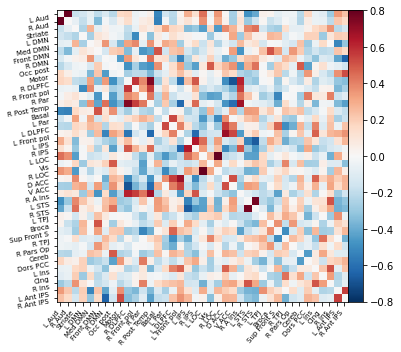

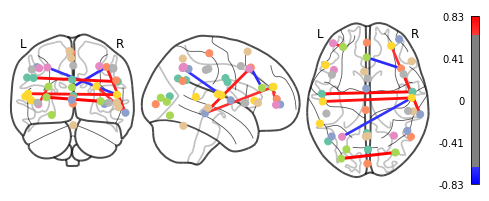

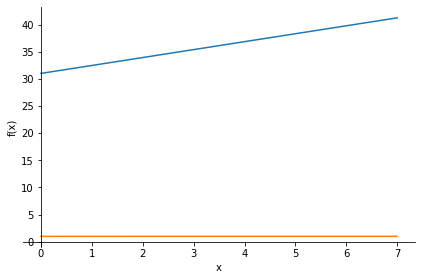

diplom/patients/MSDL/sub-OAS30578_ses-d0130_task-rest_run-2_atlas-MSDL.csv 16


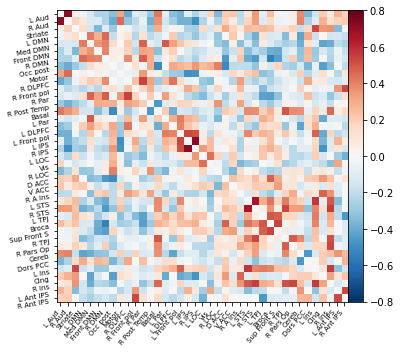

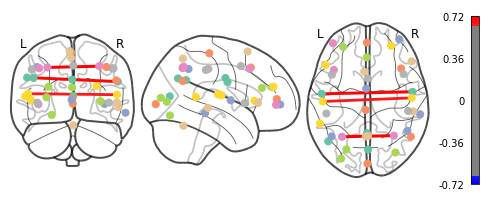

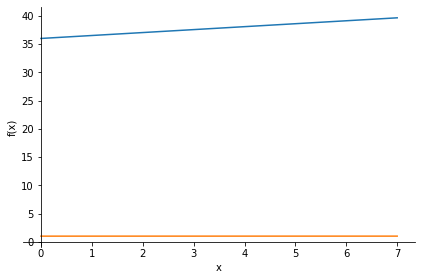

diplom/controls/MSDL/sub-OAS30960_ses-d4513_task-rest_run-1_atlas-MSDL.csv 16


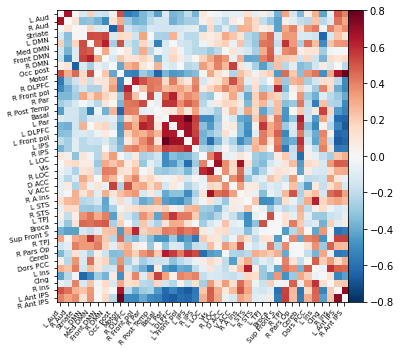

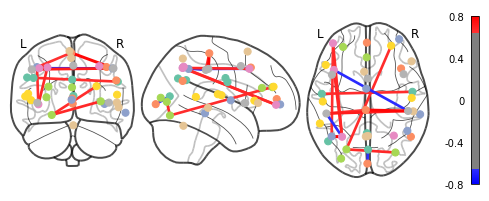

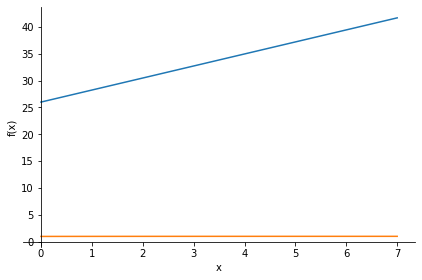

diplom/patients/MSDL/sub-OAS30388_ses-d0073_task-rest_run-2_atlas-MSDL.csv 17


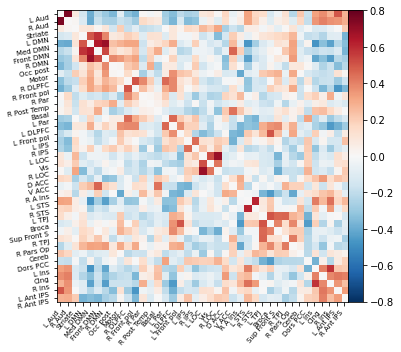

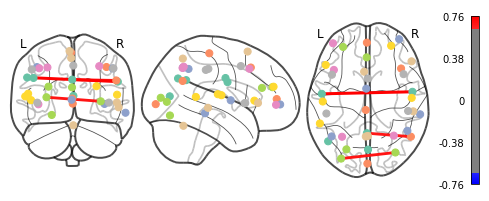

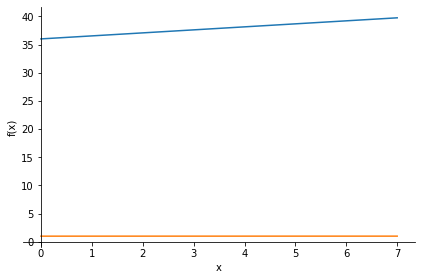

diplom/controls/MSDL/sub-OAS30052_ses-d1296_task-rest_run-1_atlas-MSDL.csv 17


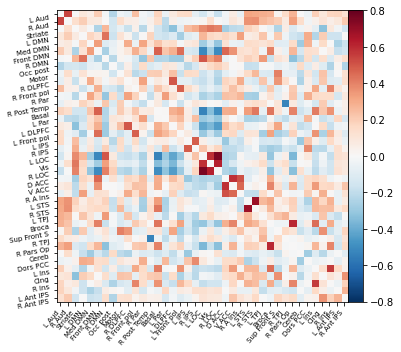

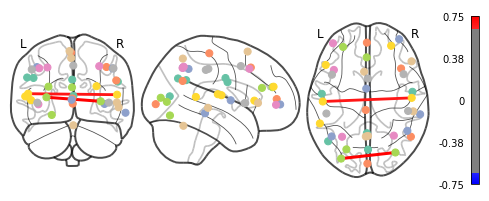

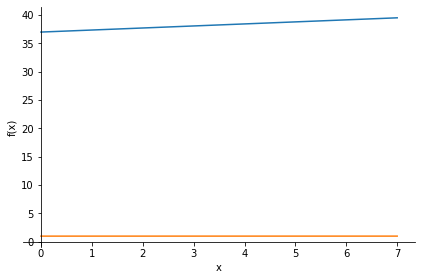

diplom/patients/MSDL/sub-OAS30859_ses-d0154_task-rest_run-1_atlas-MSDL.csv 18


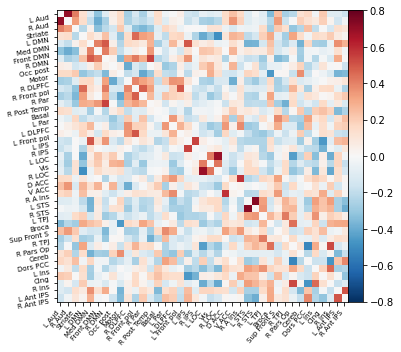

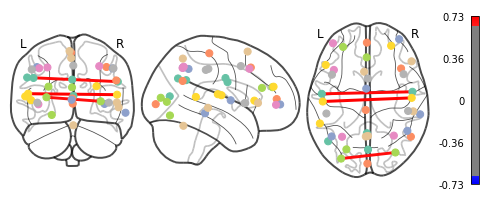

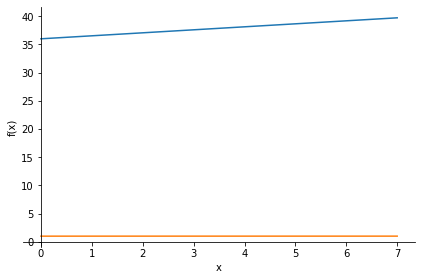

diplom/controls/MSDL/sub-OAS30982_ses-d0063_task-rest_run-2_atlas-MSDL.csv 18


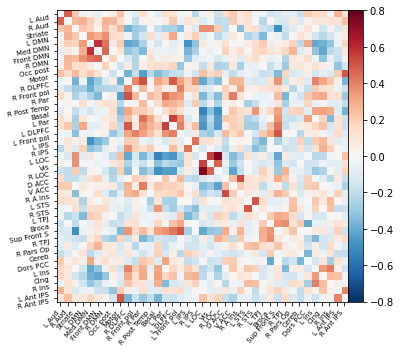

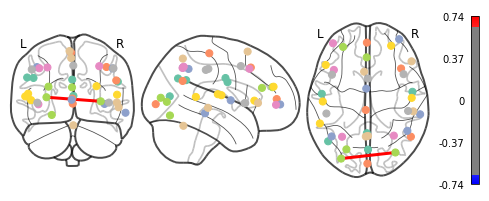

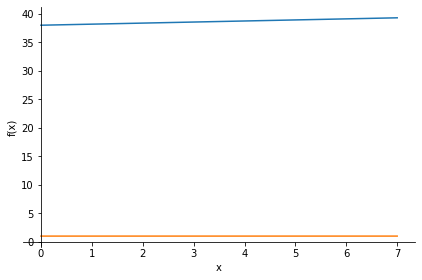

diplom/patients/MSDL/sub-OAS30982_ses-d1705_task-rest_run-1_atlas-MSDL.csv 19


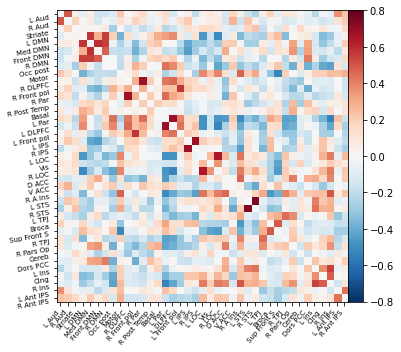

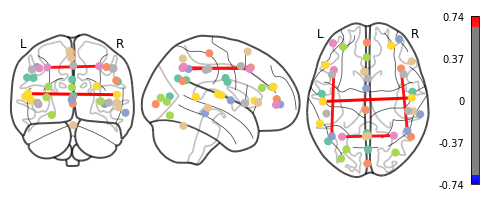

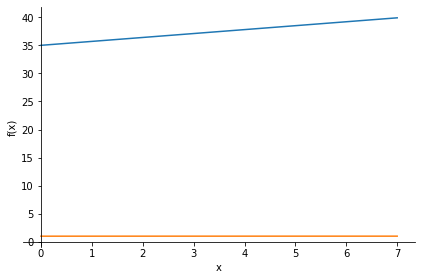

diplom/controls/MSDL/sub-OAS31172_ses-d0407_task-rest_run-2_atlas-MSDL.csv 19


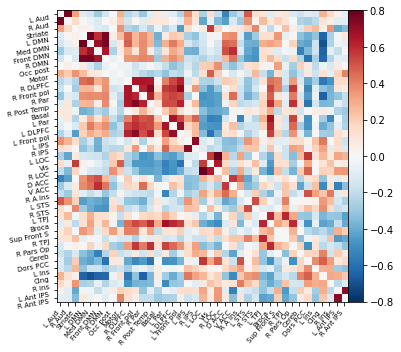

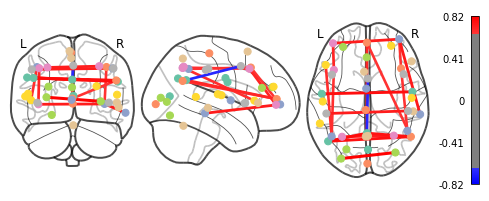

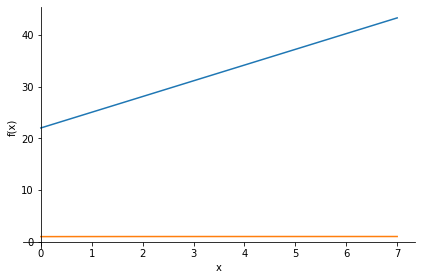

diplom/patients/MSDL/sub-OAS30896_ses-d3528_task-rest_run-2_atlas-MSDL.csv 20


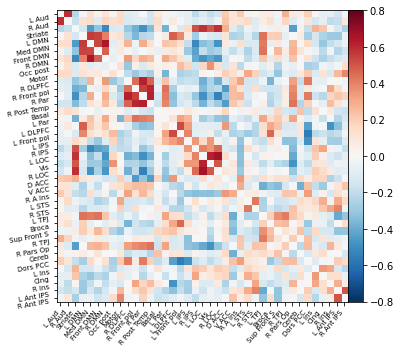

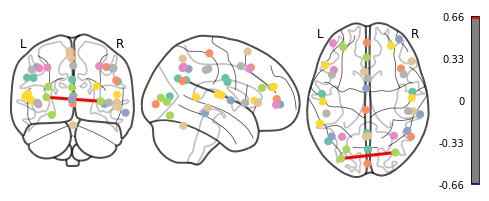

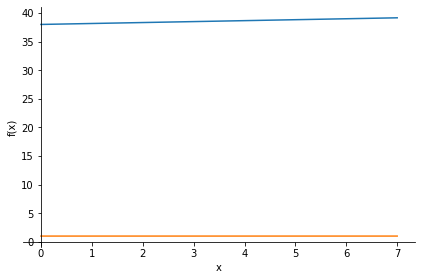

diplom/controls/MSDL/sub-OAS30632_ses-d0106_task-rest_run-1_atlas-MSDL.csv 20


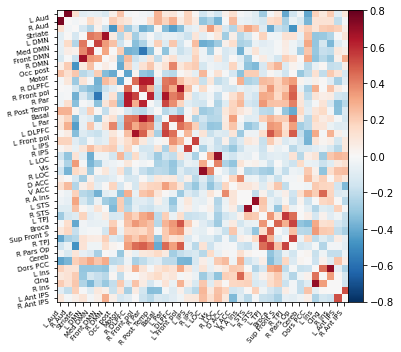

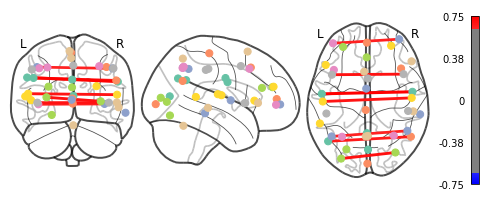

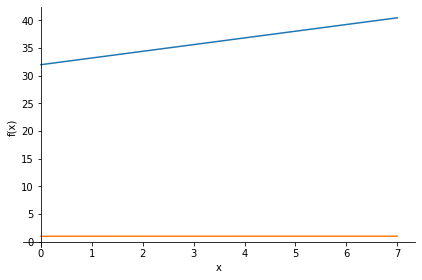

diplom/patients/MSDL/sub-OAS30286_ses-d0047_task-rest_run-1_atlas-MSDL.csv 21


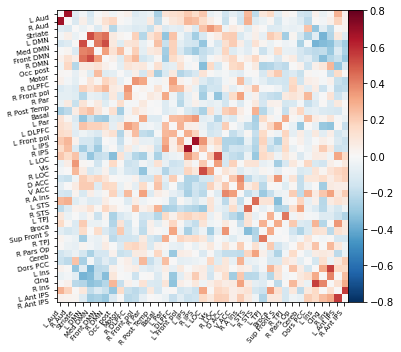

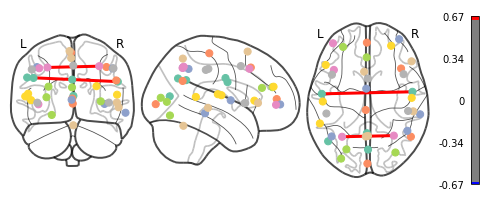

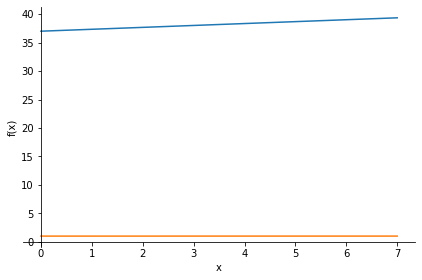

diplom/controls/MSDL/sub-OAS31158_ses-d0029_task-rest_run-1_atlas-MSDL.csv 21


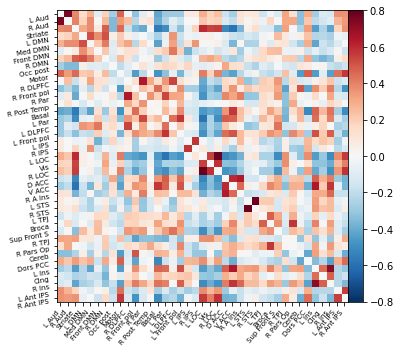

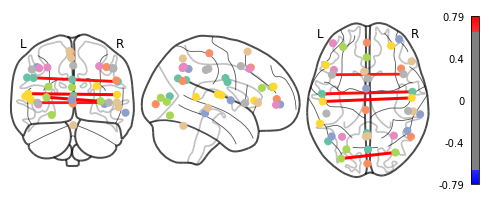

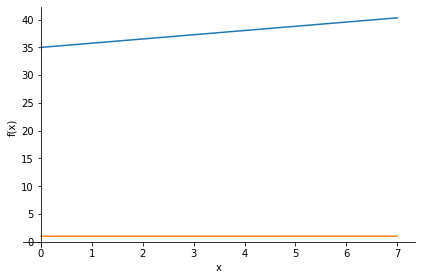

diplom/patients/MSDL/sub-OAS30720_ses-d2715_task-rest_run-3_atlas-MSDL.csv 22


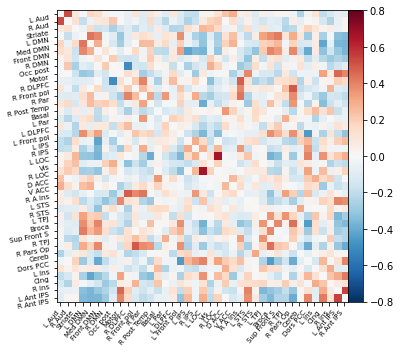

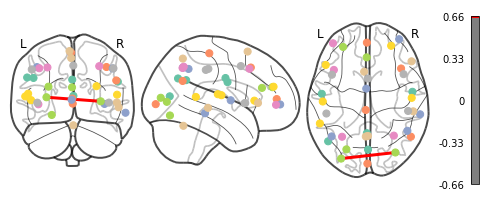

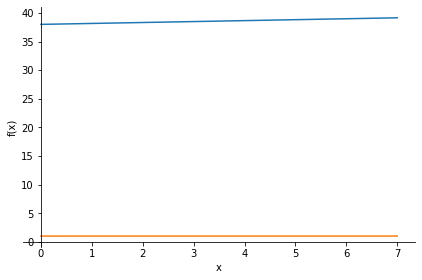

diplom/controls/MSDL/sub-OAS30794_ses-d3513_task-rest_run-1_atlas-MSDL.csv 22


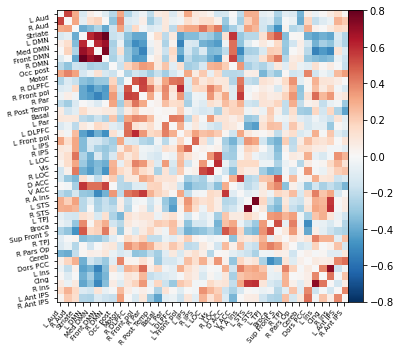

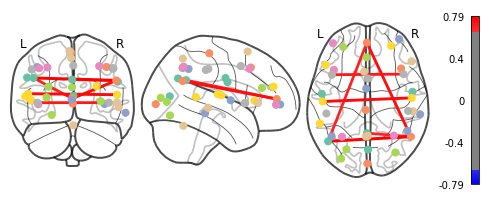

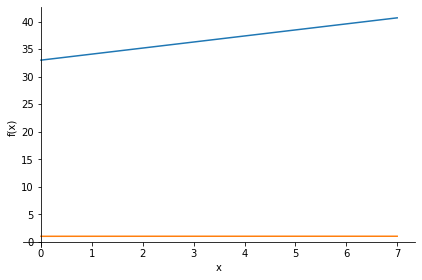

diplom/patients/MSDL/sub-OAS30085_ses-d1566_task-rest_run-2_atlas-MSDL.csv 23


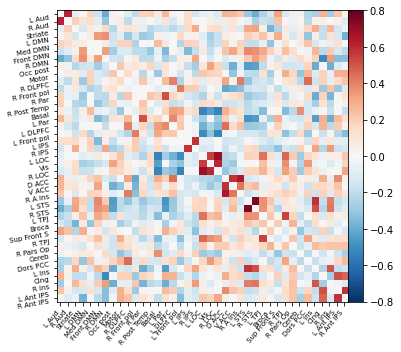

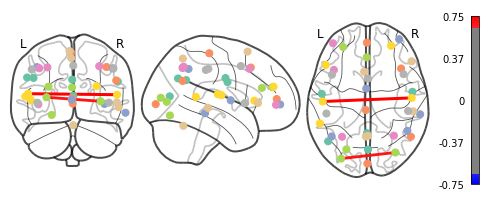

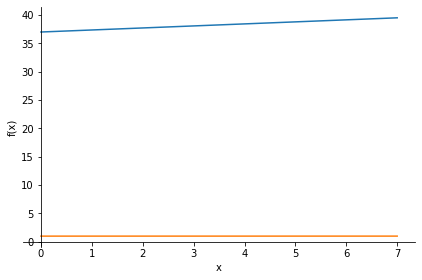

diplom/controls/MSDL/sub-OAS30884_ses-d2400_task-rest_run-2_atlas-MSDL.csv 23


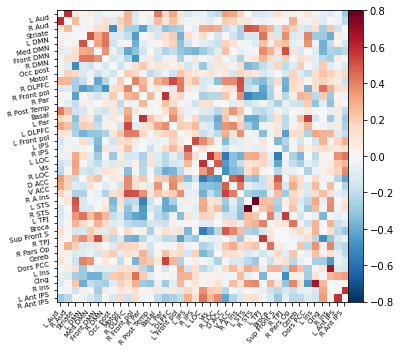

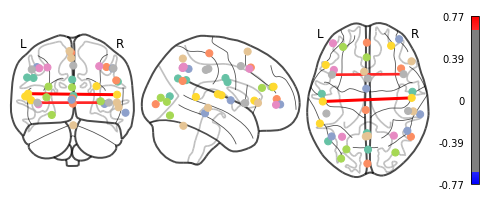

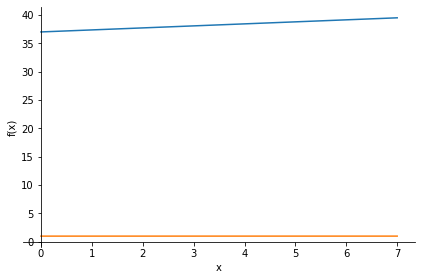

diplom/patients/MSDL/sub-OAS30273_ses-d0461_task-rest_run-2_atlas-MSDL.csv 24


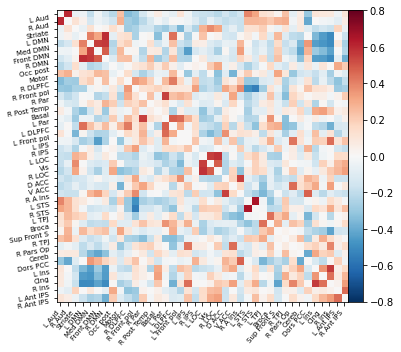

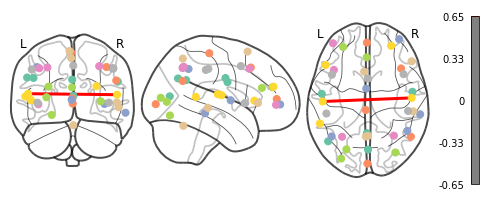

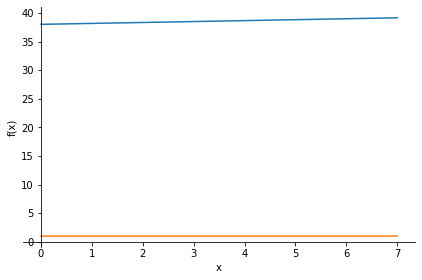

diplom/controls/MSDL/sub-OAS30989_ses-d2594_task-rest_run-2_atlas-MSDL.csv 24


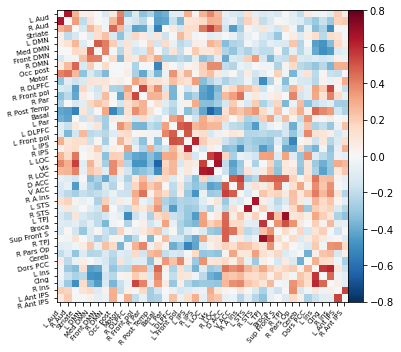

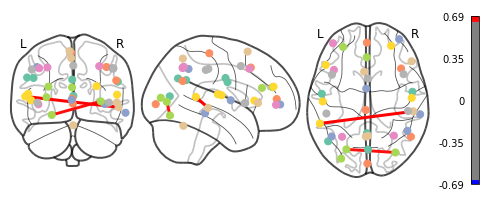

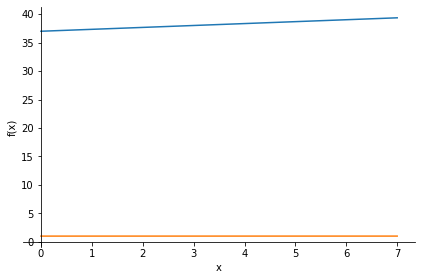

diplom/patients/MSDL/sub-OAS30930_ses-d0900_task-rest_run-2_atlas-MSDL.csv 25


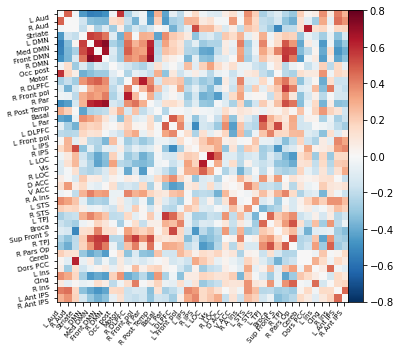

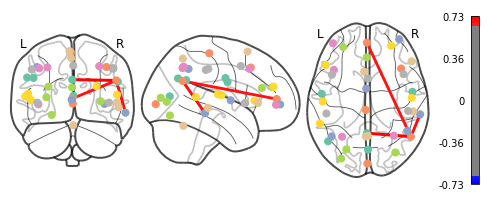

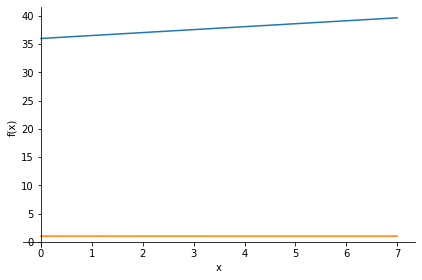

diplom/controls/MSDL/sub-OAS30005_ses-d2377_task-rest_run-1_atlas-MSDL.csv 25


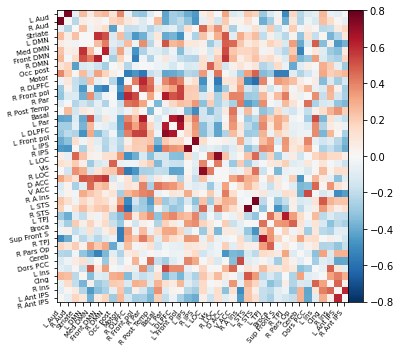

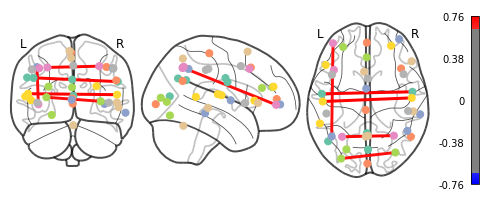

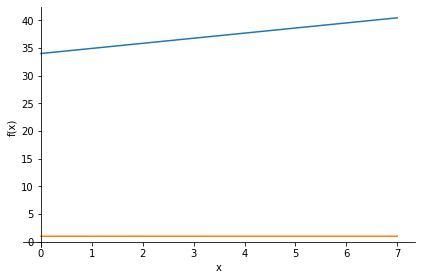

diplom/patients/MSDL/sub-OAS30013_ses-d0102_task-rest_run-2_atlas-MSDL.csv 26


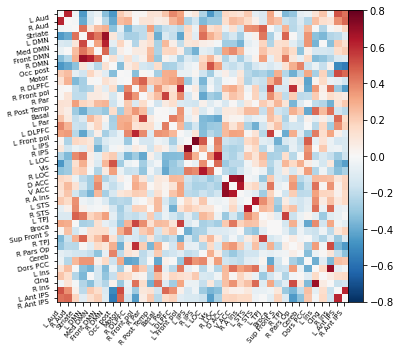

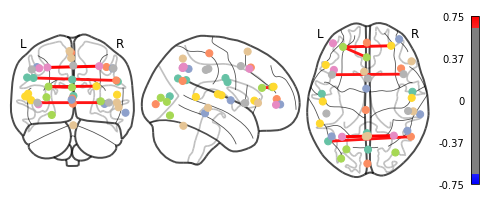

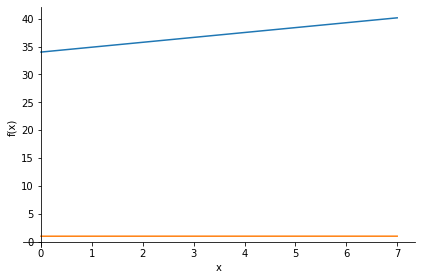

diplom/controls/MSDL/sub-OAS30462_ses-d1232_task-rest_run-2_atlas-MSDL.csv 26


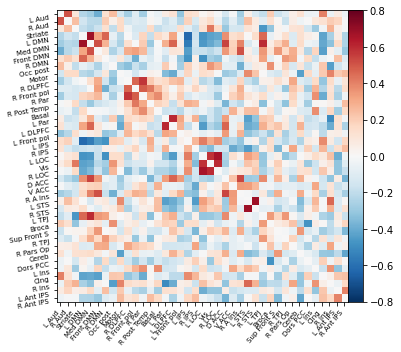

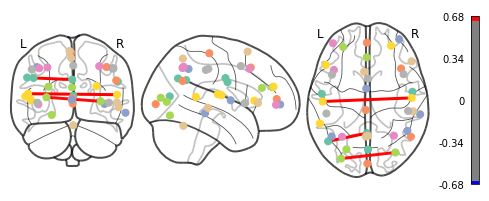

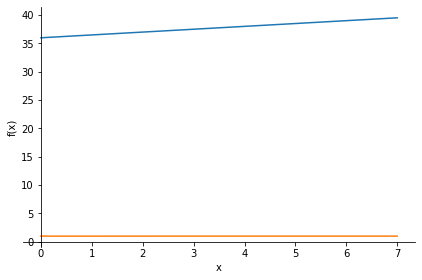

diplom/patients/MSDL/sub-OAS30781_ses-d0971_task-rest_run-1_atlas-MSDL.csv 27


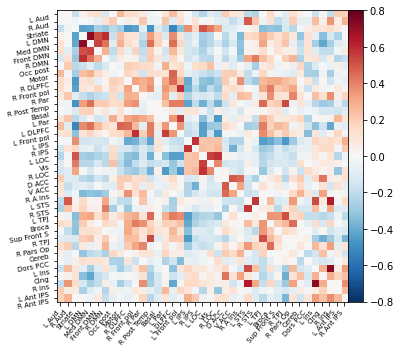

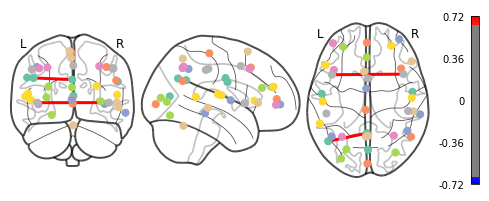

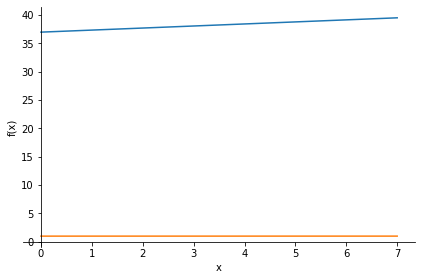

diplom/controls/MSDL/sub-OAS30101_ses-d0919_task-rest_run-3_atlas-MSDL.csv 27


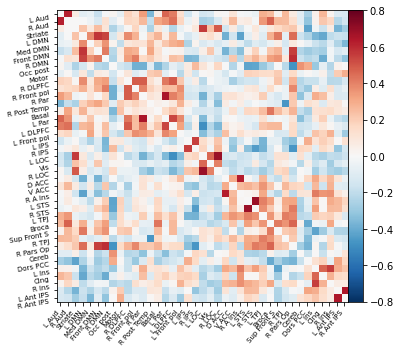

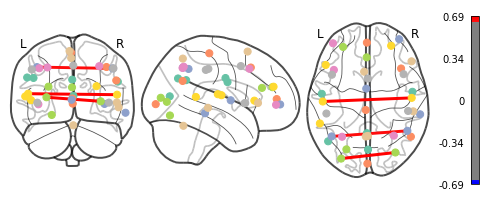

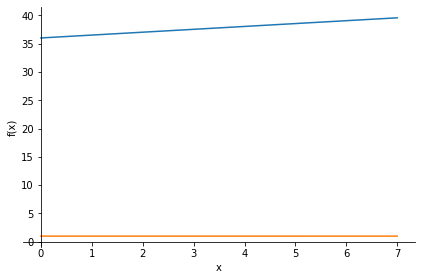

diplom/patients/MSDL/sub-OAS31097_ses-d2763_task-rest_run-2_atlas-MSDL.csv 28


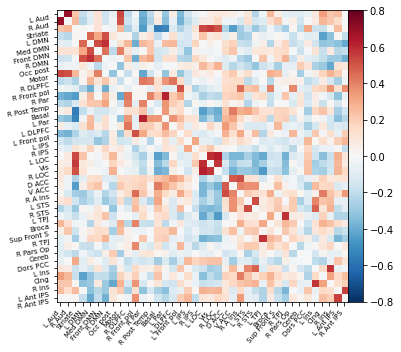

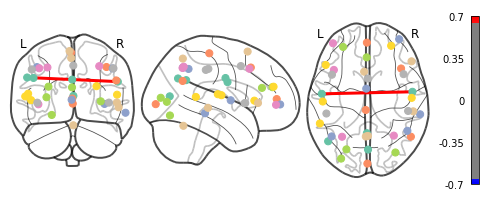

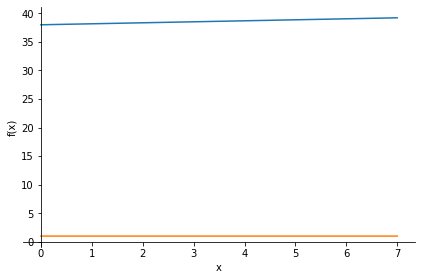

diplom/controls/MSDL/sub-OAS30058_ses-d2236_task-rest_run-1_atlas-MSDL.csv 28


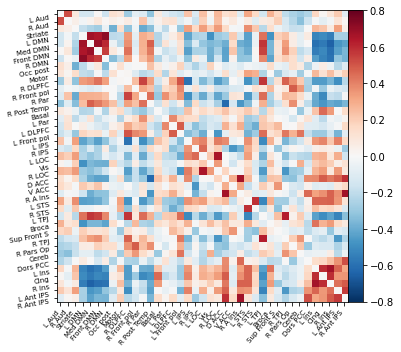

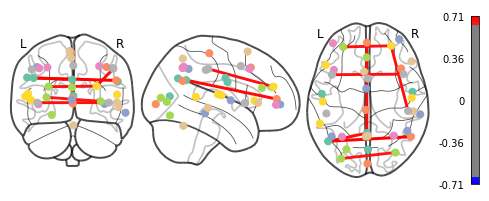

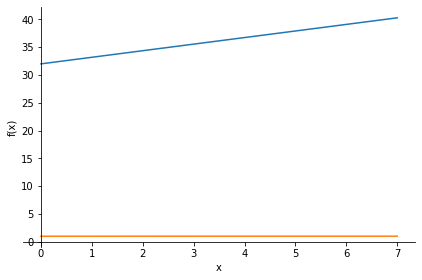

diplom/patients/MSDL/sub-OAS31035_ses-d5659_task-rest_run-1_atlas-MSDL.csv 29


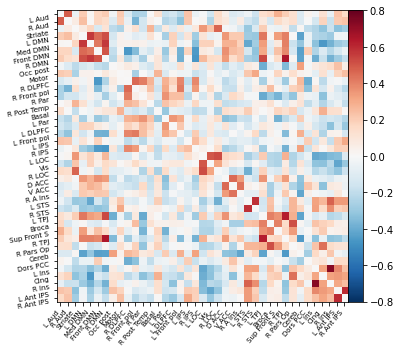

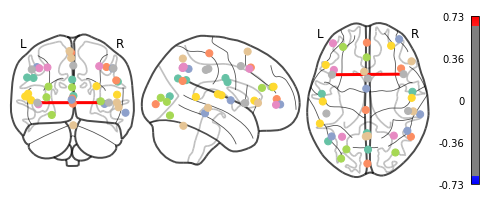

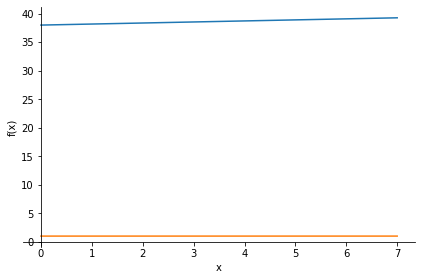

diplom/controls/MSDL/sub-OAS31118_ses-d2847_task-rest_run-2_atlas-MSDL.csv 29


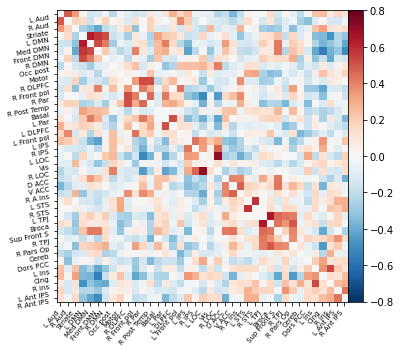

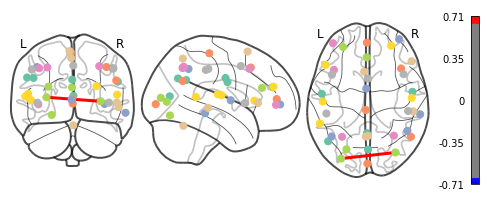

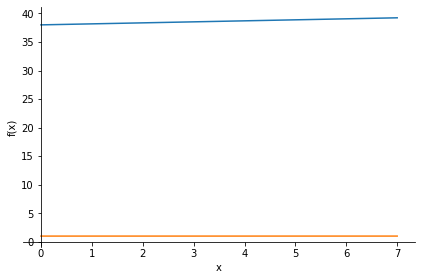

diplom/patients/MSDL/sub-OAS31043_ses-d0437_task-rest_run-2_atlas-MSDL.csv 30


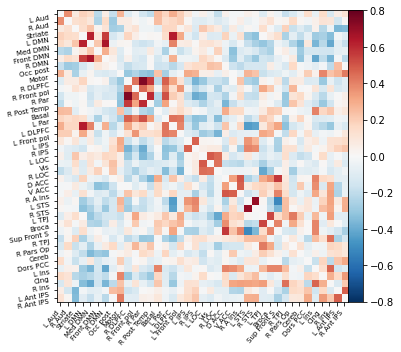

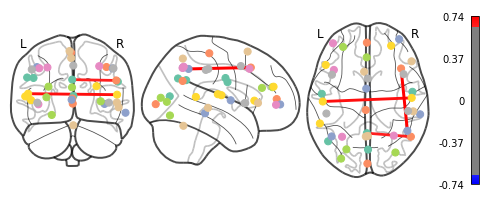

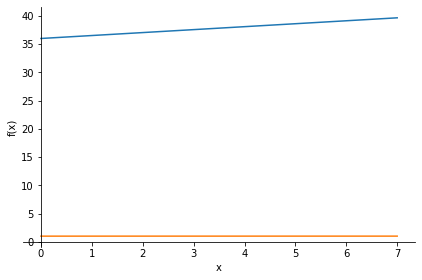

diplom/controls/MSDL/sub-OAS30191_ses-d1136_task-rest_run-1_atlas-MSDL.csv 30


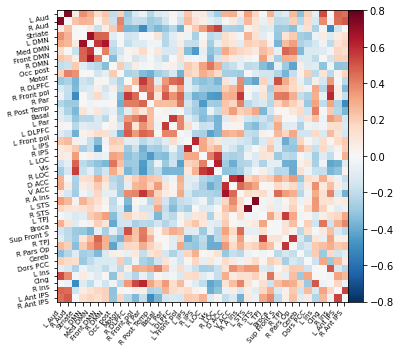

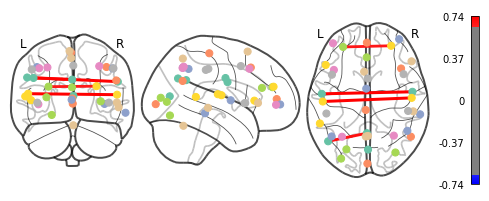

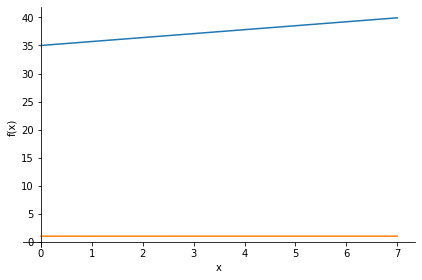

diplom/patients/MSDL/sub-OAS30029_ses-d0893_task-rest_run-1_atlas-MSDL.csv 31


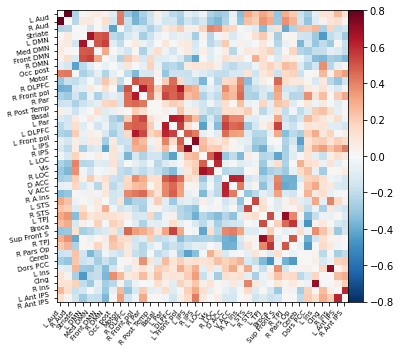

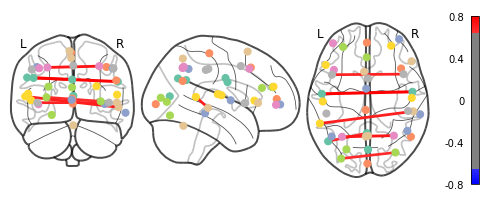

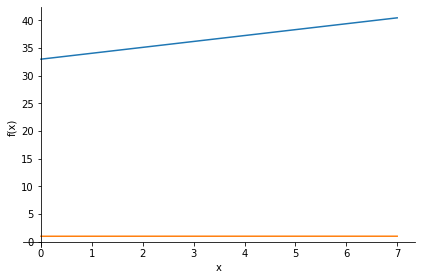

diplom/controls/MSDL/sub-OAS31048_ses-d2398_task-rest_run-1_atlas-MSDL.csv 31


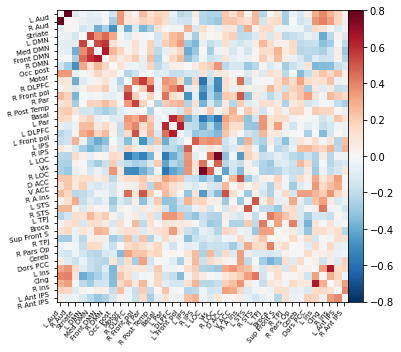

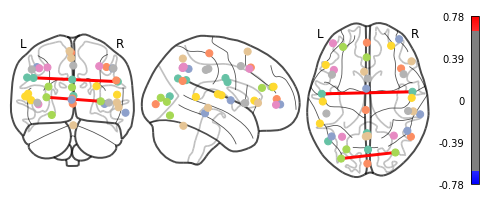

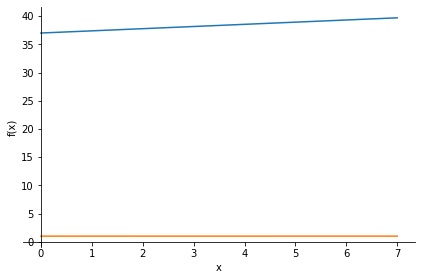

diplom/patients/MSDL/sub-OAS30518_ses-d0089_task-rest_run-2_atlas-MSDL.csv 32


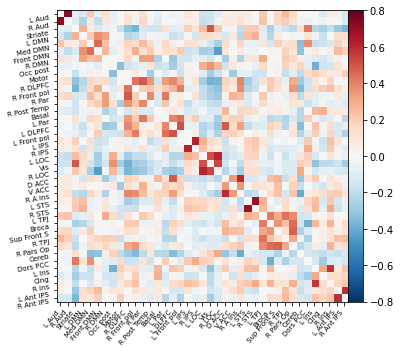

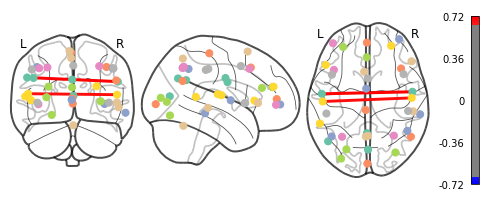

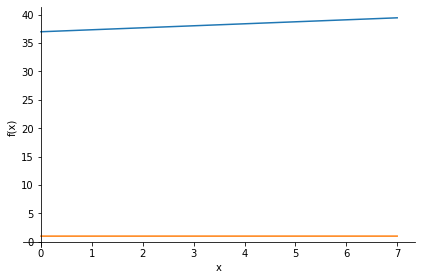

diplom/controls/MSDL/sub-OAS30211_ses-d0046_task-rest_run-2_atlas-MSDL.csv 32


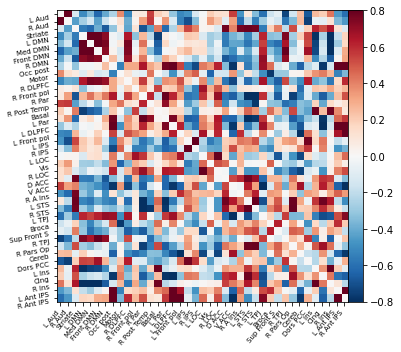

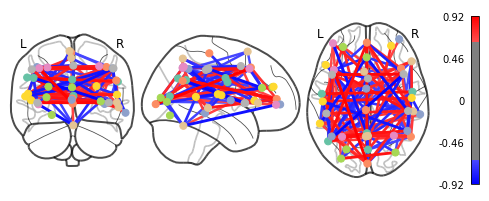

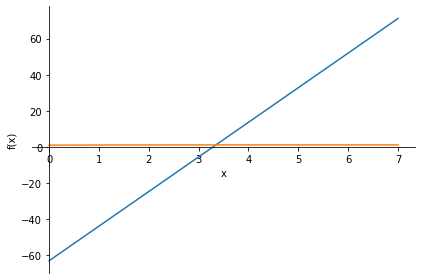

diplom/patients/MSDL/sub-OAS30619_ses-d2640_task-rest_run-2_atlas-MSDL.csv 33


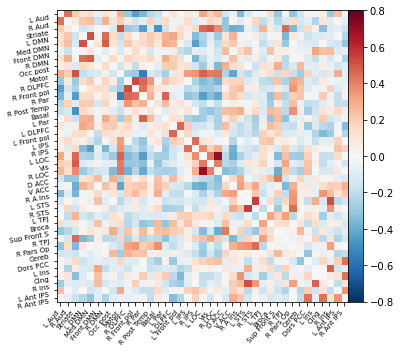

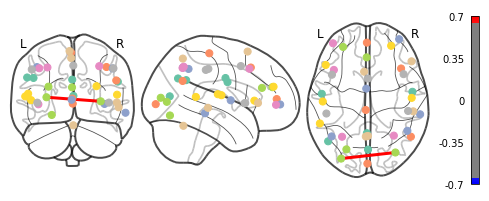

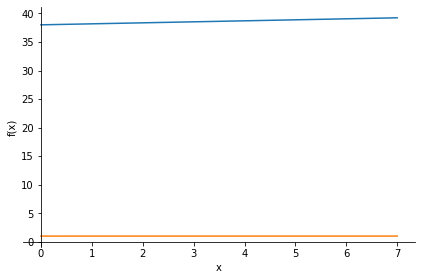

diplom/controls/MSDL/sub-OAS31125_ses-d0735_task-rest_run-1_atlas-MSDL.csv 33


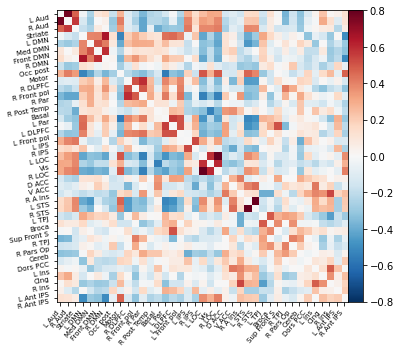

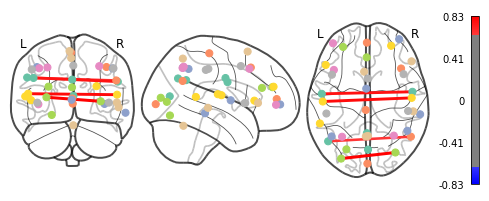

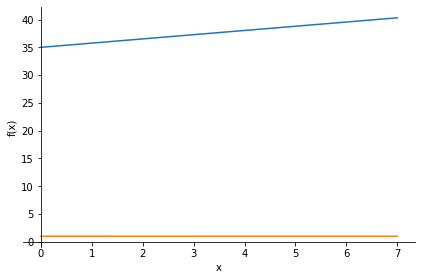

diplom/patients/MSDL/sub-OAS30791_ses-d2794_task-rest_run-2_atlas-MSDL.csv 34


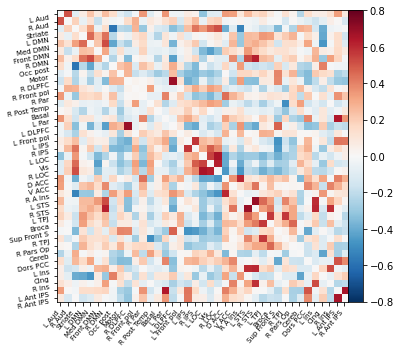

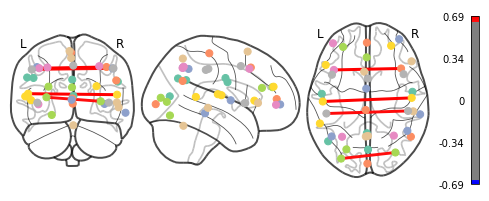

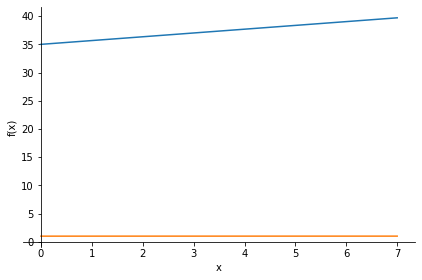

diplom/controls/MSDL/sub-OAS30660_ses-d1732_task-rest_run-1_atlas-MSDL.csv 34


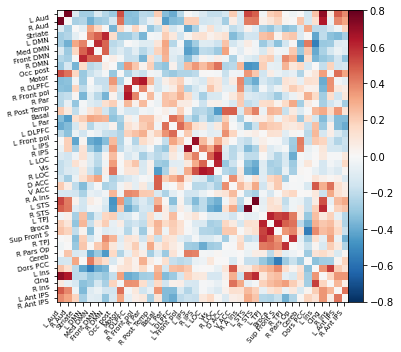

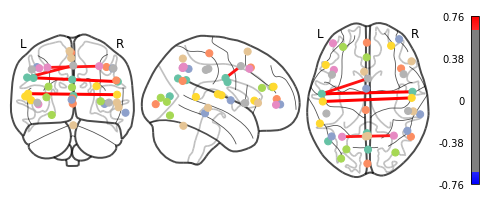

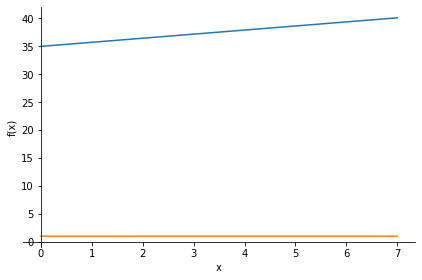

diplom/patients/MSDL/sub-OAS30436_ses-d0388_task-rest_run-2_atlas-MSDL.csv 35


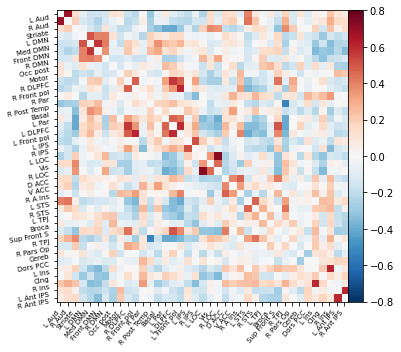

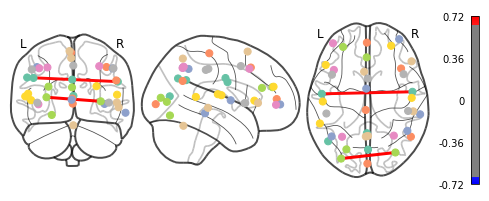

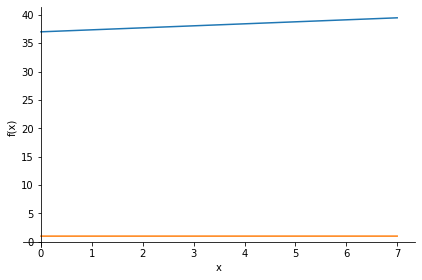

diplom/controls/MSDL/sub-OAS30080_ses-d1318_task-rest_run-1_atlas-MSDL.csv 35


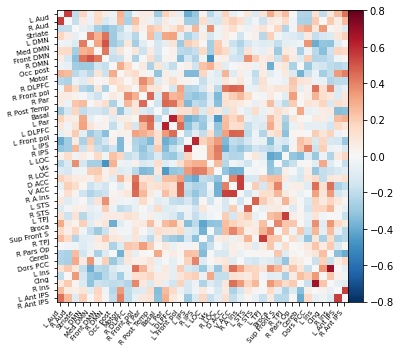

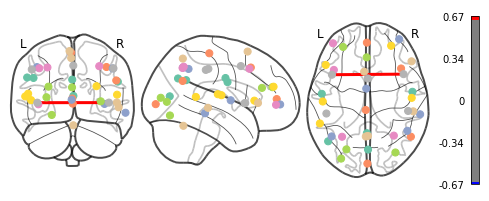

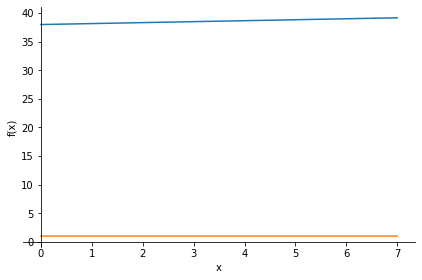

diplom/patients/MSDL/sub-OAS30976_ses-d0065_task-rest_run-1_atlas-MSDL.csv 36


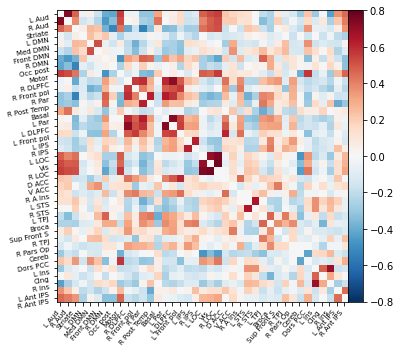

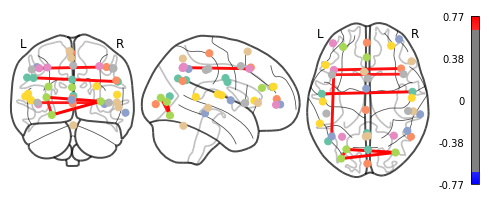

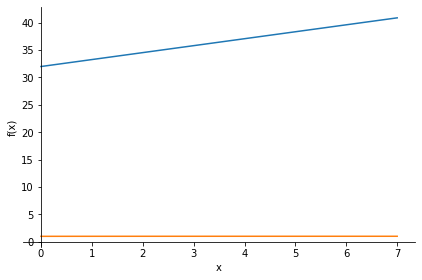

diplom/controls/MSDL/sub-OAS30393_ses-d7726_task-rest_run-1_atlas-MSDL.csv 36


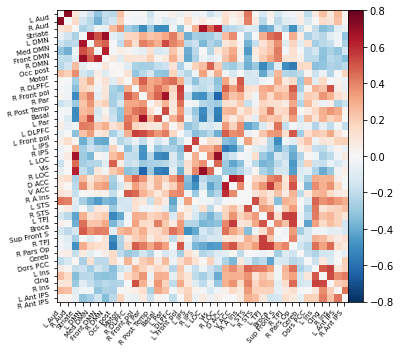

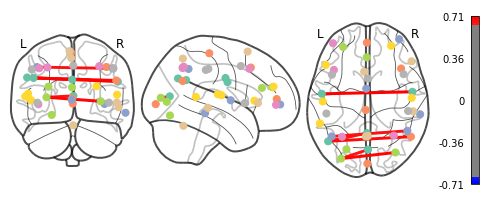

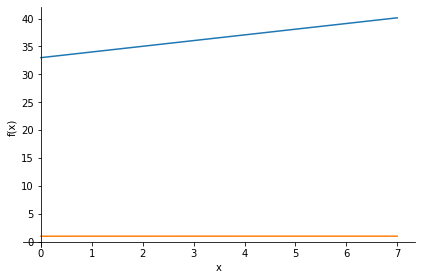

diplom/patients/MSDL/sub-OAS30312_ses-d0068_task-rest_run-2_atlas-MSDL.csv 37


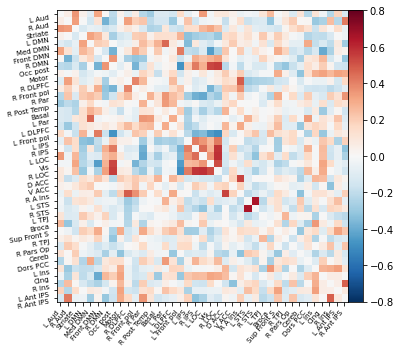

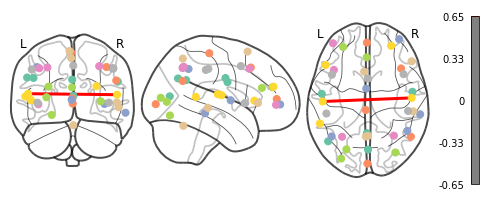

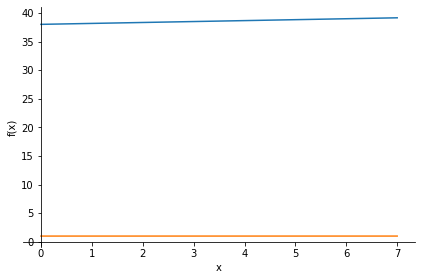

diplom/controls/MSDL/sub-OAS30006_ses-d2341_task-rest_run-1_atlas-MSDL.csv 37


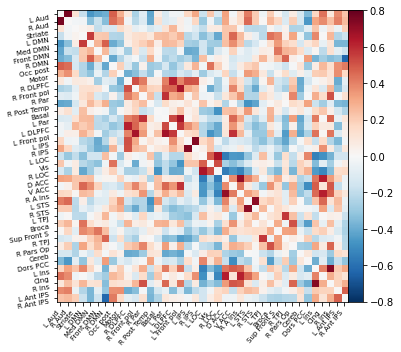

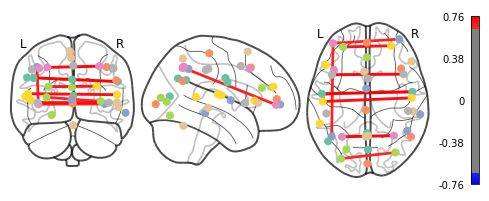

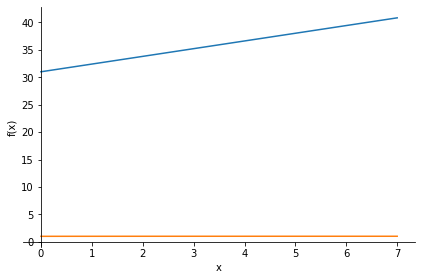

diplom/patients/MSDL/sub-OAS30975_ses-d0008_task-rest_run-2_atlas-MSDL.csv 38


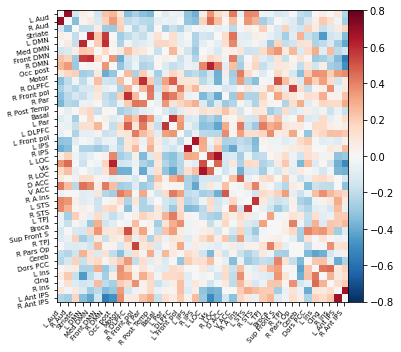

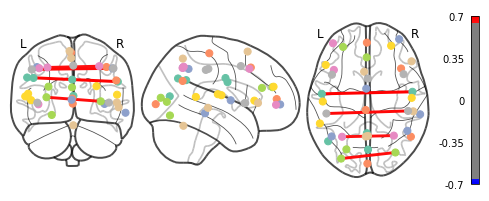

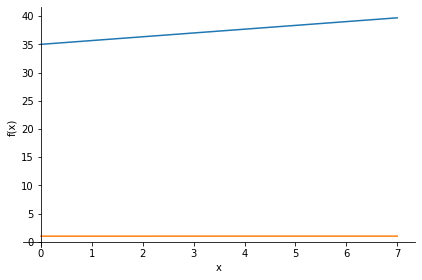

diplom/controls/MSDL/sub-OAS30258_ses-d1225_task-rest_run-2_atlas-MSDL.csv 38


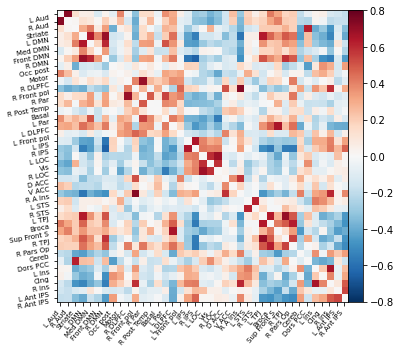

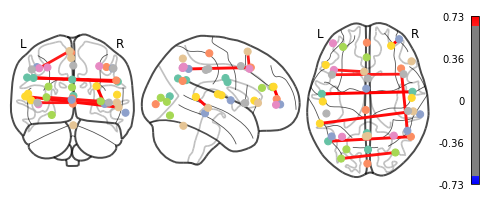

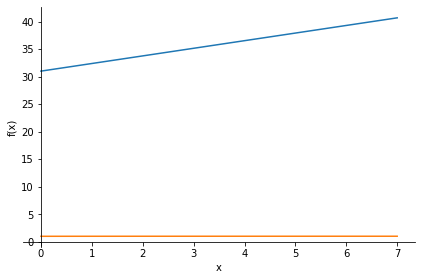

diplom/patients/MSDL/sub-OAS30119_ses-d3260_task-rest_run-1_atlas-MSDL.csv 39


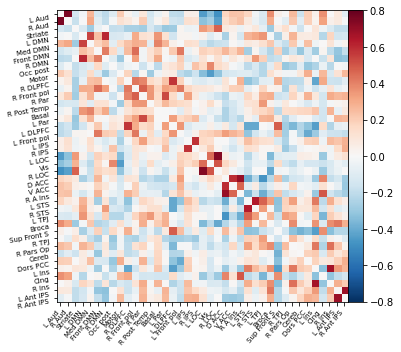

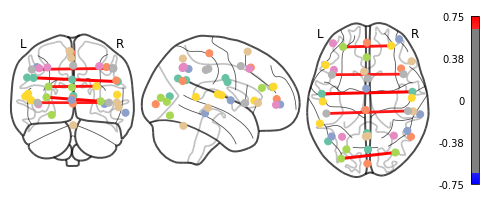

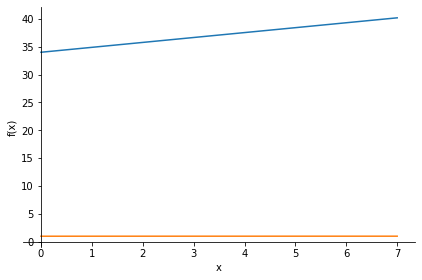

diplom/controls/MSDL/sub-OAS30032_ses-d3499_task-rest_run-1_atlas-MSDL.csv 39


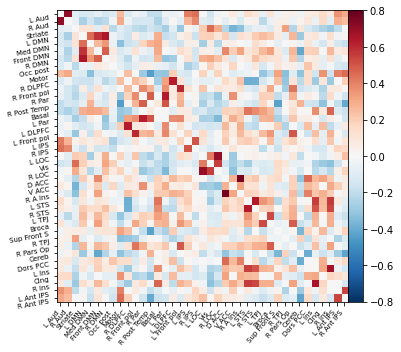

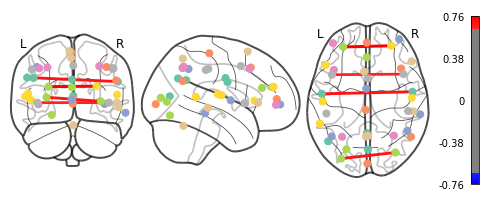

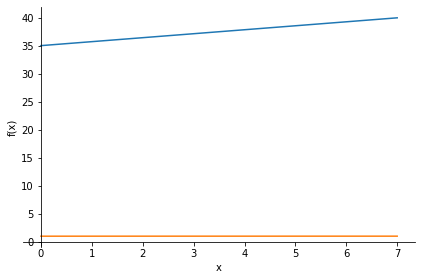

diplom/patients/MSDL/sub-OAS31104_ses-d2333_task-rest_run-1_atlas-MSDL.csv 40


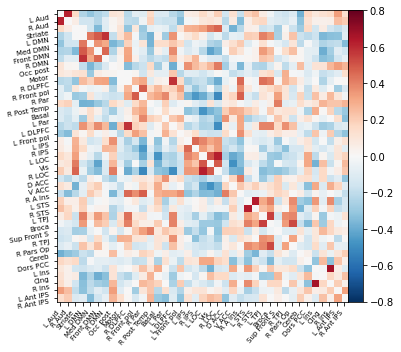

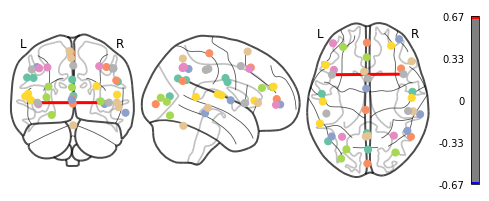

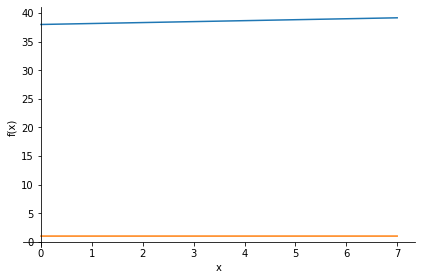

diplom/controls/MSDL/sub-OAS30750_ses-d0894_task-rest_run-2_atlas-MSDL.csv 40


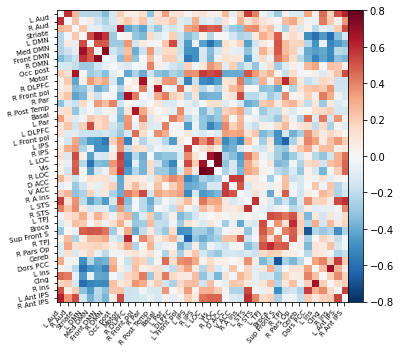

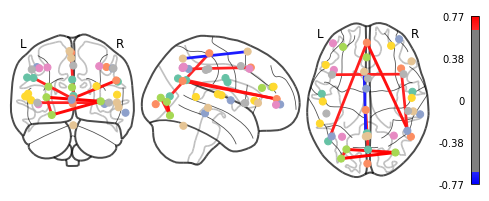

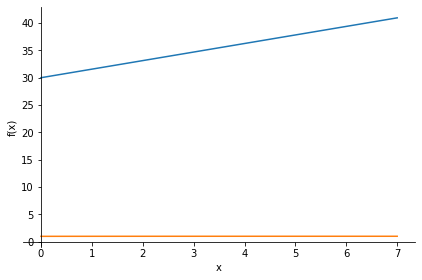

diplom/patients/MSDL/sub-OAS30915_ses-d0085_task-rest_run-1_atlas-MSDL.csv 41


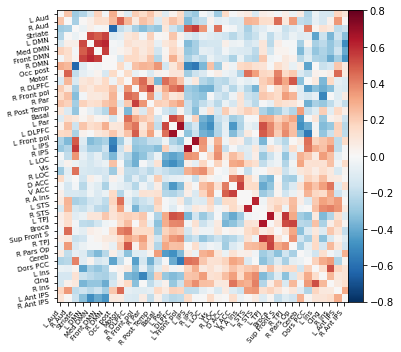

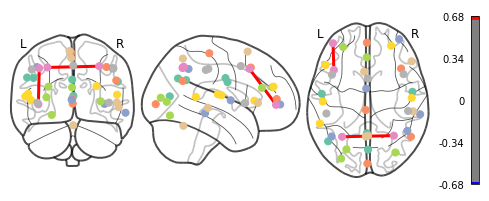

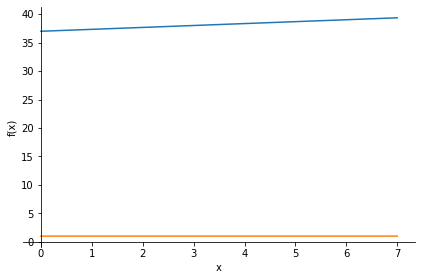

diplom/controls/MSDL/sub-OAS30817_ses-d2324_task-rest_run-1_atlas-MSDL.csv 41


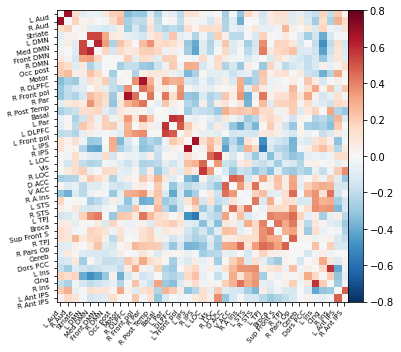

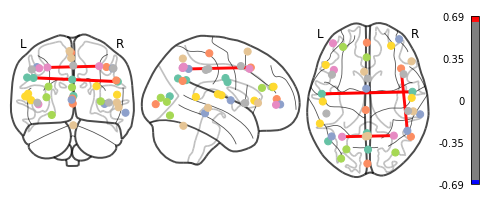

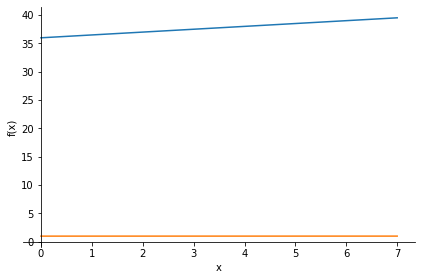

diplom/patients/MSDL/sub-OAS30132_ses-d1392_task-rest_run-2_atlas-MSDL.csv 42


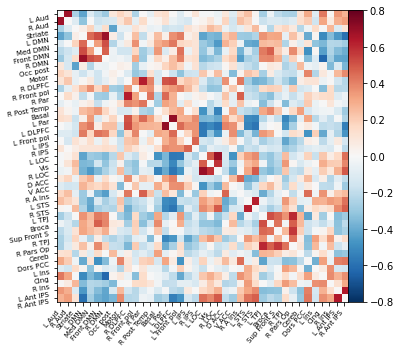

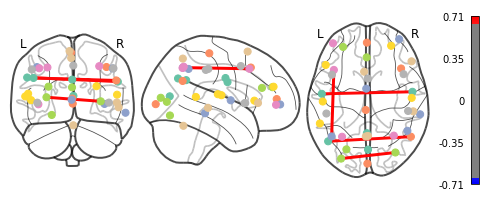

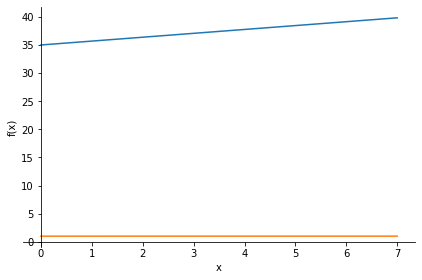

diplom/controls/MSDL/sub-OAS31083_ses-d1981_task-rest_run-1_atlas-MSDL.csv 42


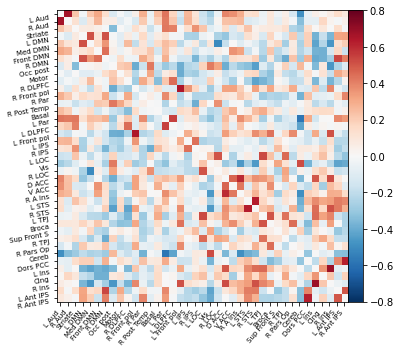

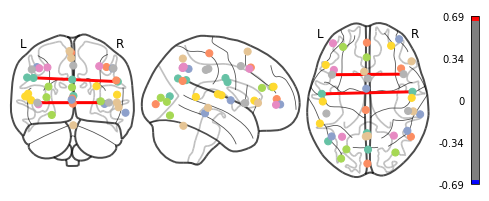

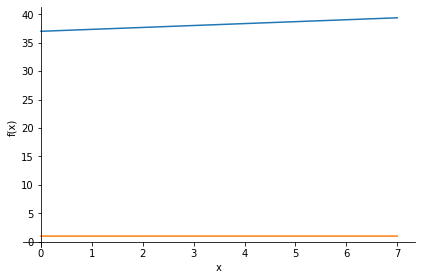

diplom/patients/MSDL/sub-OAS30116_ses-d0017_task-rest_run-1_atlas-MSDL.csv 43


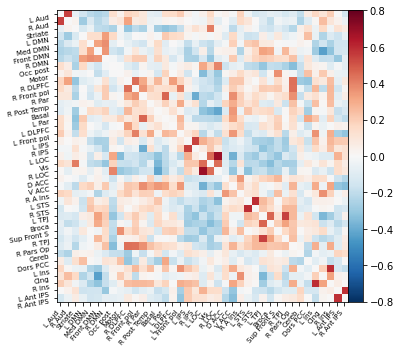

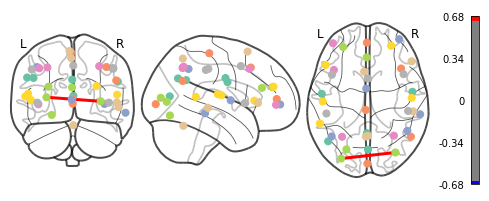

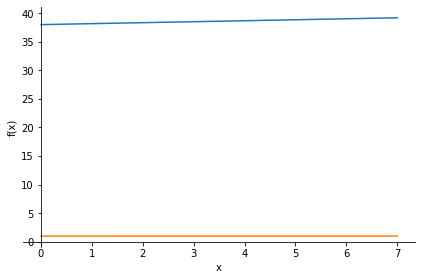

diplom/controls/MSDL/sub-OAS30871_ses-d0040_task-rest_run-2_atlas-MSDL.csv 43


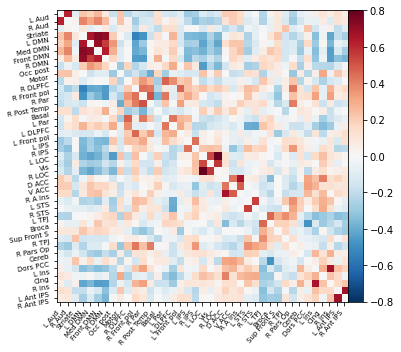

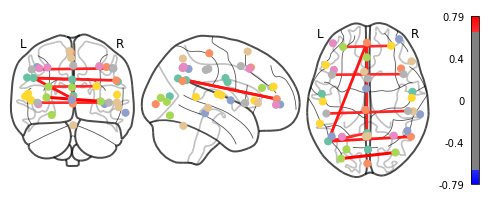

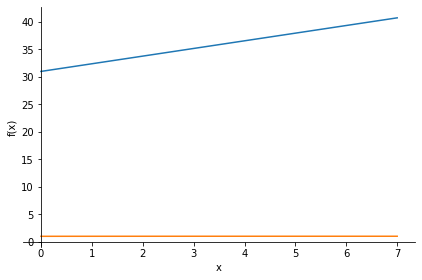

diplom/patients/MSDL/sub-OAS30403_ses-d2868_task-rest_run-2_atlas-MSDL.csv 44


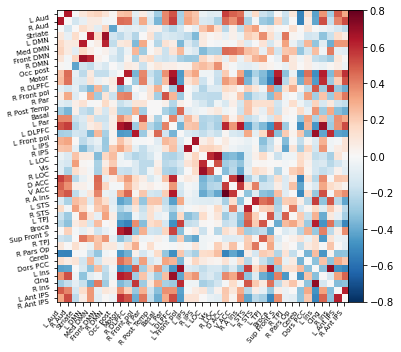

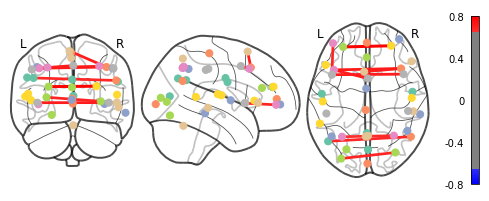

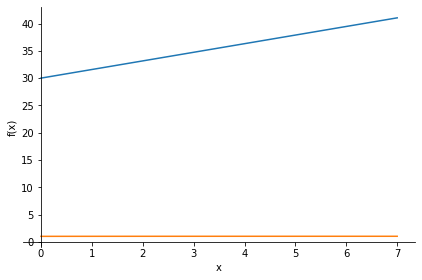

diplom/controls/MSDL/sub-OAS31064_ses-d3439_task-rest_run-2_atlas-MSDL.csv 44


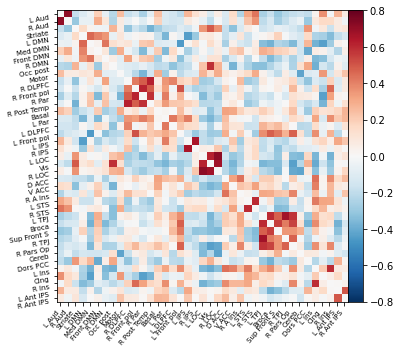

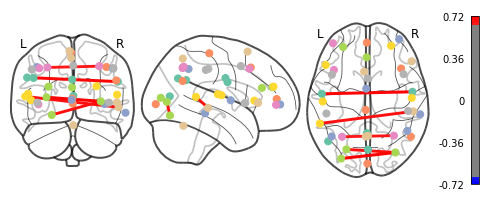

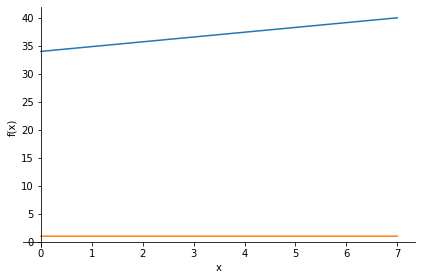

diplom/patients/MSDL/sub-OAS30734_ses-d0857_task-rest_run-2_atlas-MSDL.csv 45


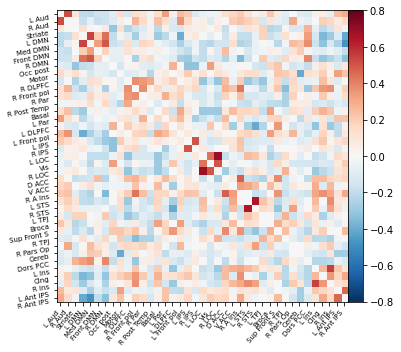

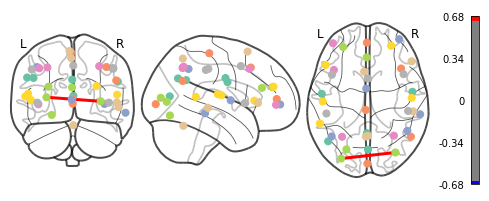

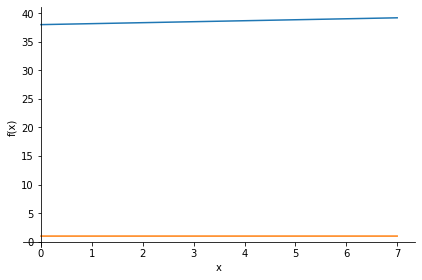

diplom/controls/MSDL/sub-OAS30770_ses-d1201_task-rest_run-2_atlas-MSDL.csv 45


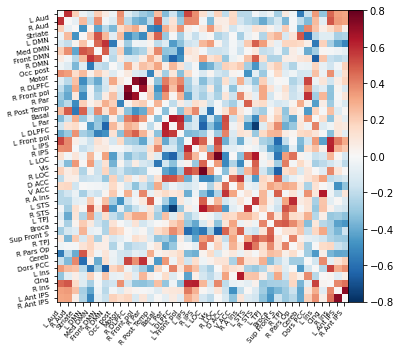

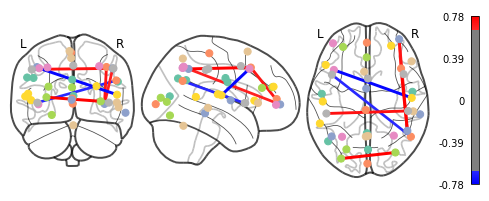

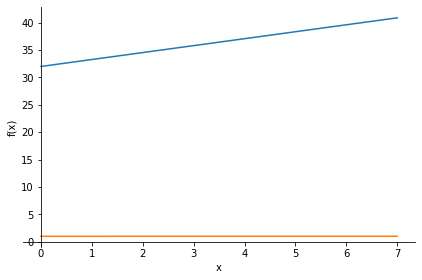

diplom/patients/MSDL/sub-OAS30214_ses-d4464_task-rest_run-1_atlas-MSDL.csv 46


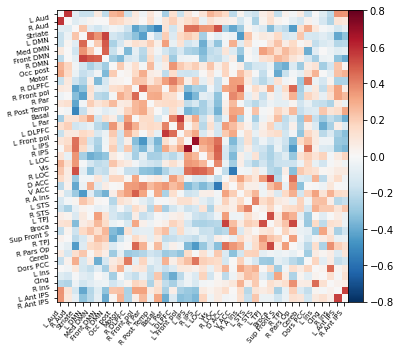

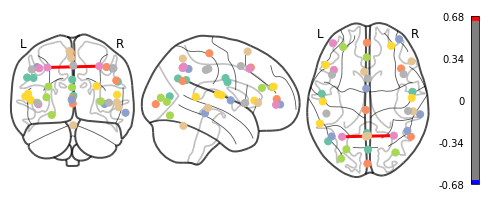

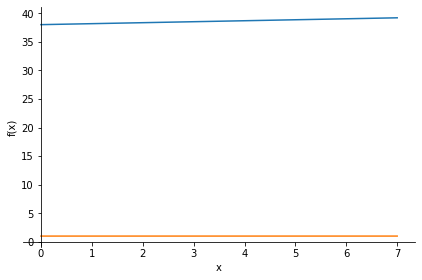

diplom/controls/MSDL/sub-OAS30620_ses-d2211_task-rest_run-1_atlas-MSDL.csv 46


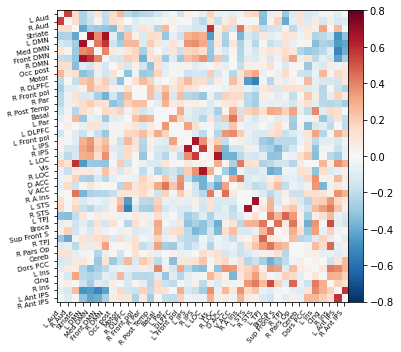

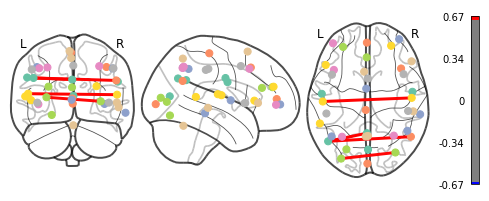

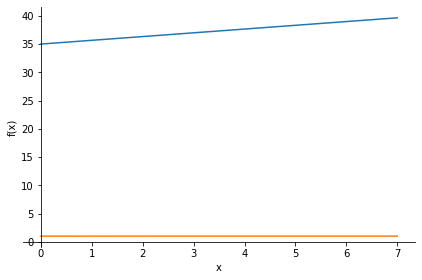

diplom/patients/MSDL/sub-OAS31093_ses-d0063_task-rest_run-1_atlas-MSDL.csv 47


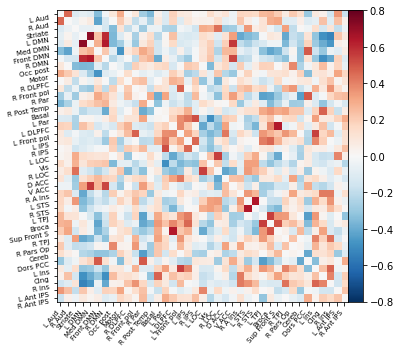

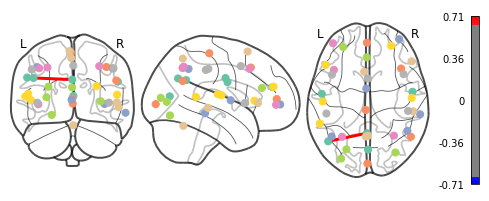

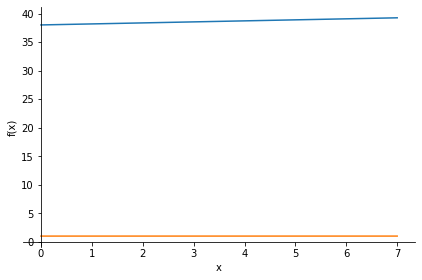

diplom/controls/MSDL/sub-OAS30142_ses-d0075_task-rest_run-2_atlas-MSDL.csv 47


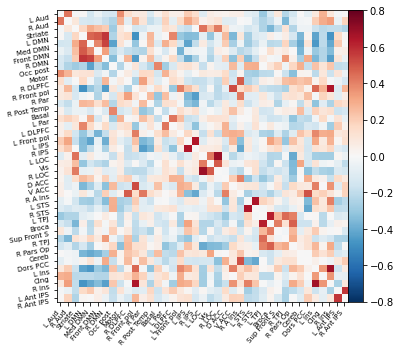

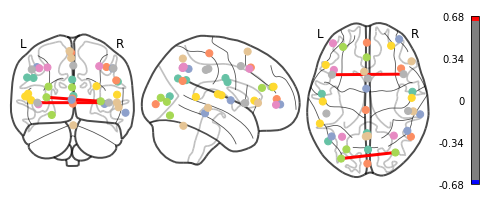

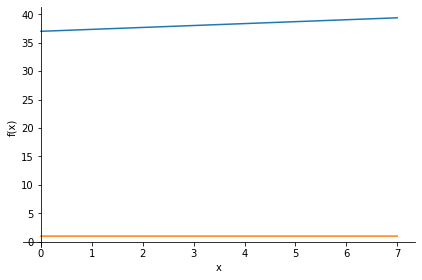

diplom/patients/MSDL/sub-OAS30653_ses-d0102_task-rest_run-1_atlas-MSDL.csv 48


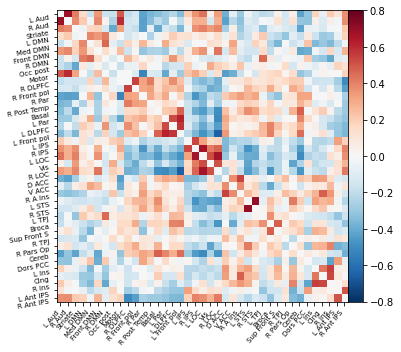

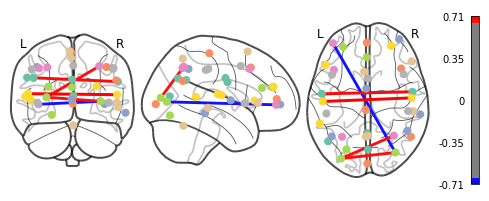

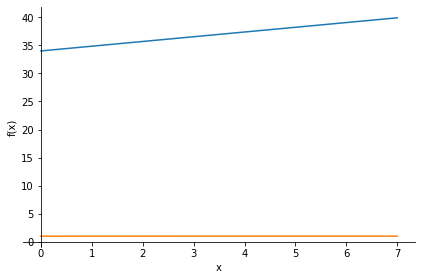

diplom/controls/MSDL/sub-OAS30295_ses-d0967_task-rest_run-2_atlas-MSDL.csv 48


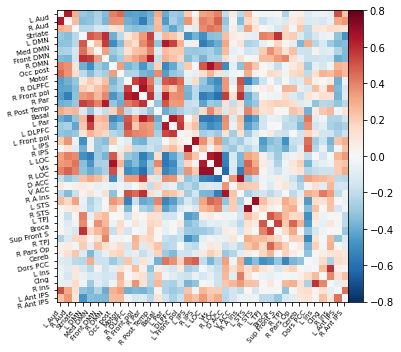

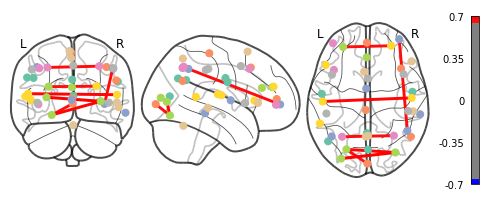

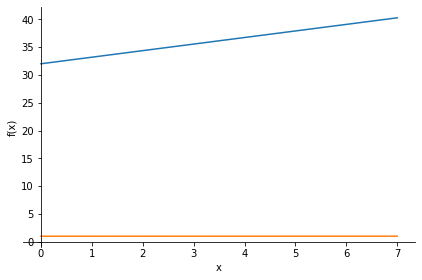

diplom/patients/MSDL/sub-OAS31127_ses-d2140_task-rest_run-2_atlas-MSDL.csv 49


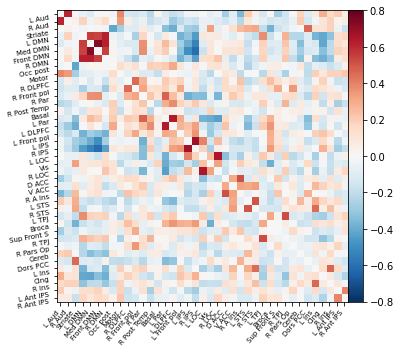

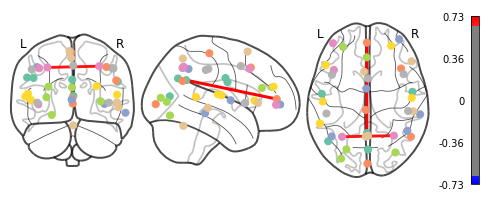

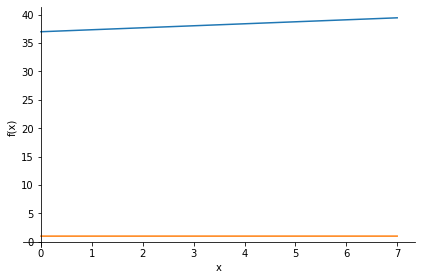

diplom/controls/MSDL/sub-OAS30033_ses-d1267_task-rest_run-2_atlas-MSDL.csv 49


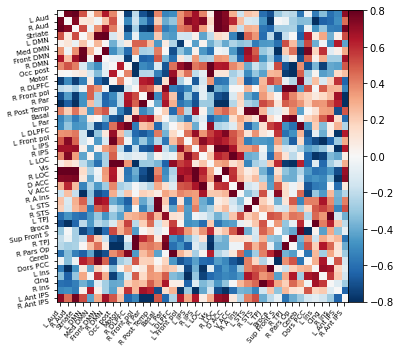

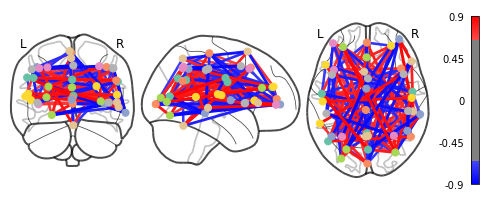

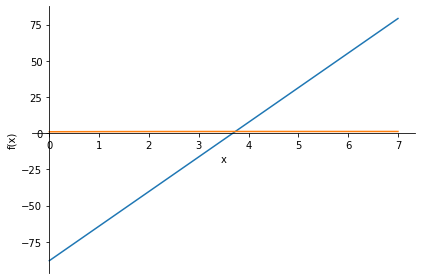

diplom/patients/MSDL/sub-OAS30866_ses-d0033_task-rest_run-2_atlas-MSDL.csv 50


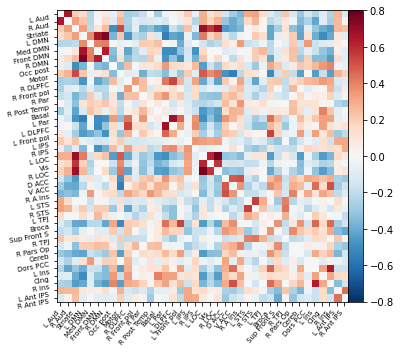

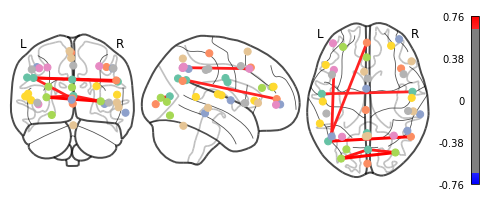

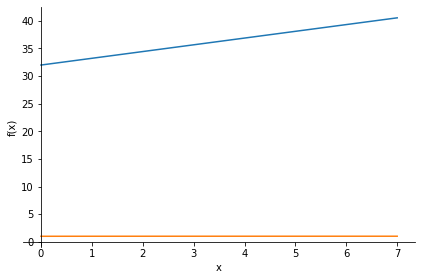

diplom/controls/MSDL/sub-OAS30073_ses-d2851_task-rest_run-1_atlas-MSDL.csv 50


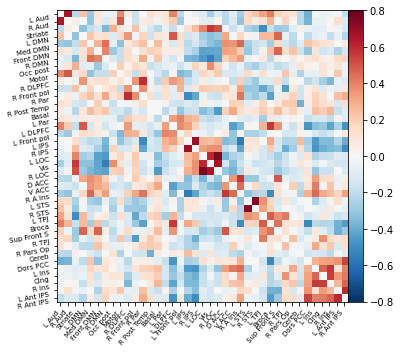

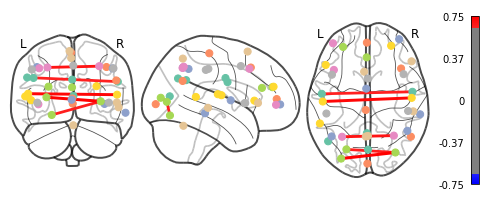

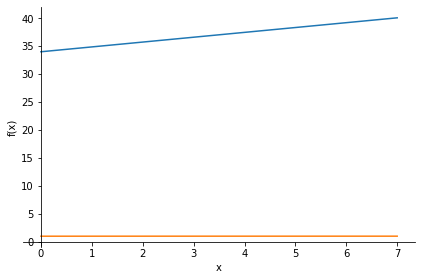

diplom/patients/MSDL/sub-OAS30282_ses-d0040_task-rest_run-2_atlas-MSDL.csv 51


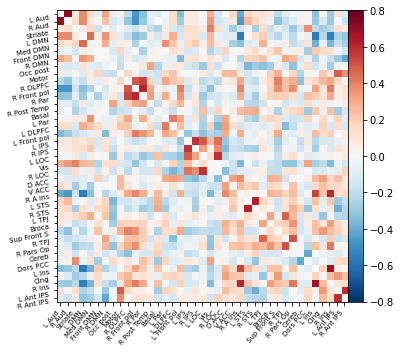

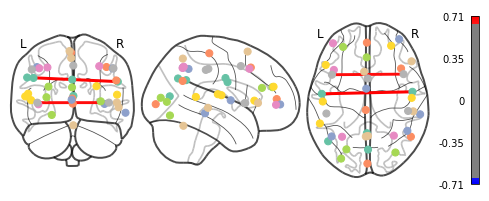

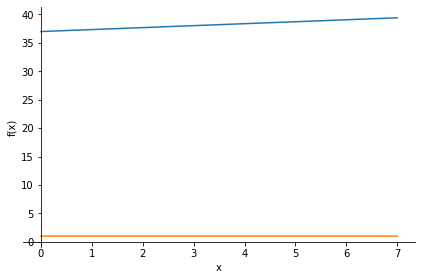

diplom/controls/MSDL/sub-OAS30015_ses-d2004_task-rest_run-1_atlas-MSDL.csv 51


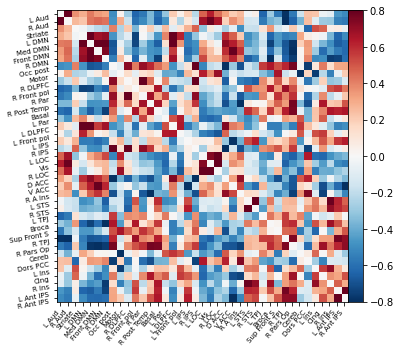

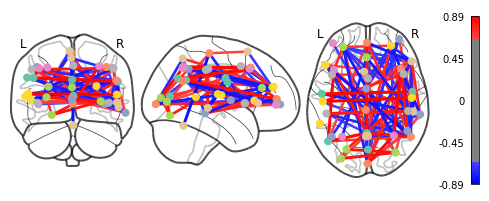

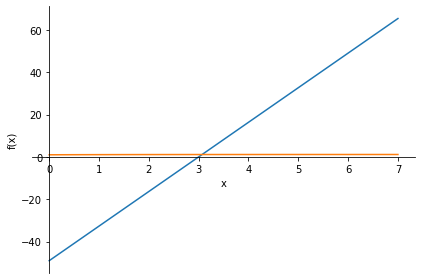

diplom/patients/MSDL/sub-OAS30815_ses-d0148_task-rest_run-2_atlas-MSDL.csv 52


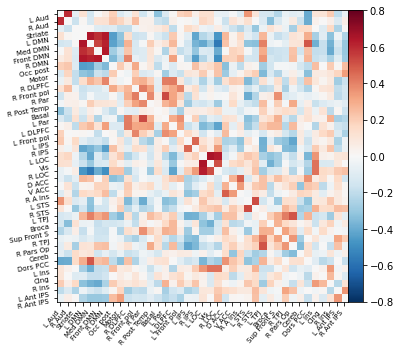

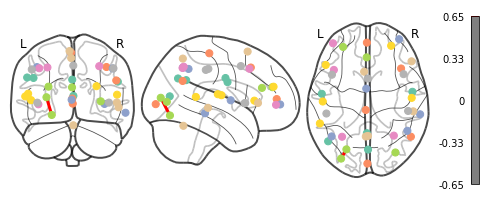

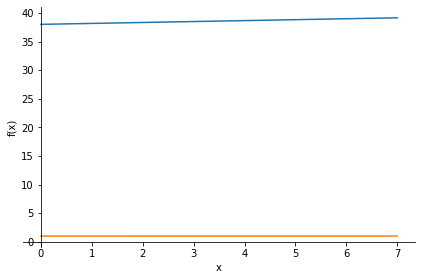

diplom/controls/MSDL/sub-OAS30007_ses-d2722_task-rest_run-1_atlas-MSDL.csv 52


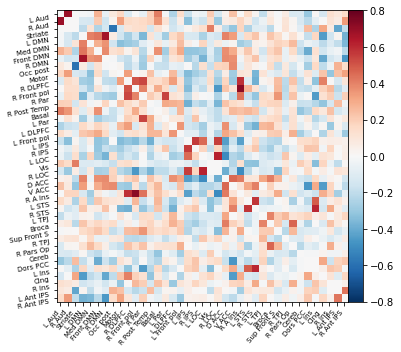

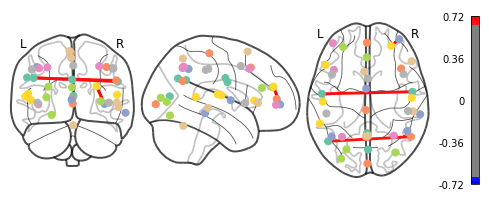

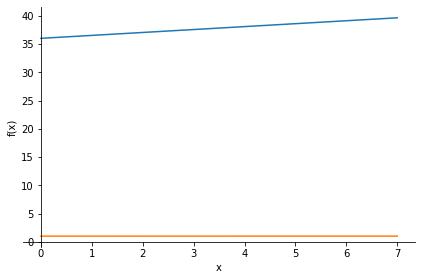

diplom/patients/MSDL/sub-OAS30982_ses-d1708_task-rest_run-2_atlas-MSDL.csv 53


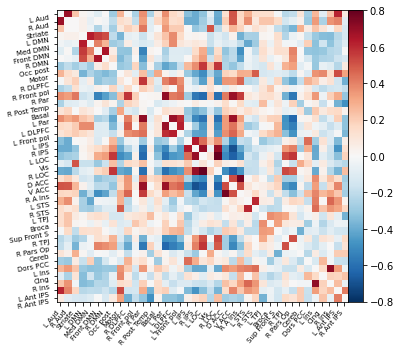

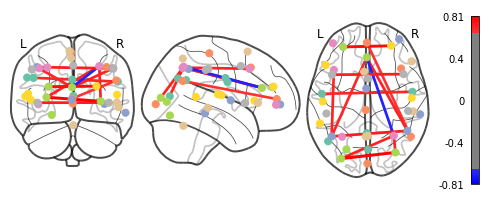

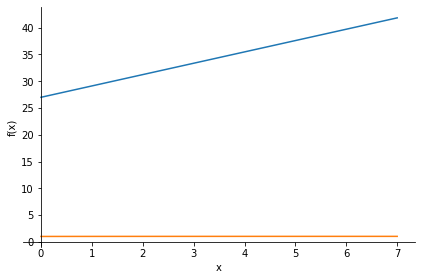

diplom/controls/MSDL/sub-OAS30762_ses-d0043_task-rest_run-2_atlas-MSDL.csv 53


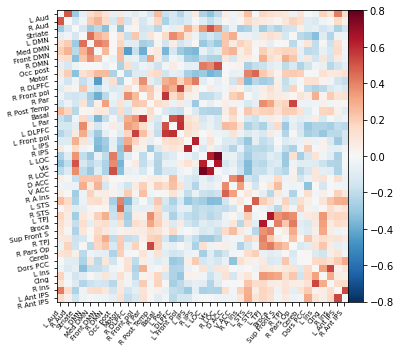

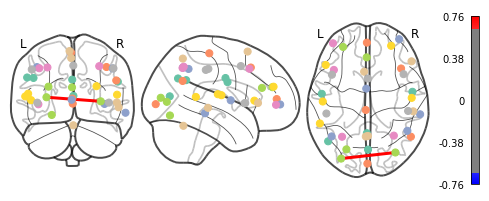

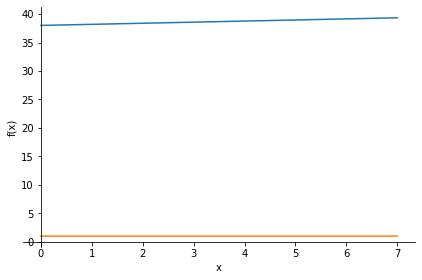

diplom/patients/MSDL/sub-OAS31030_ses-d0031_task-rest_run-1_atlas-MSDL.csv 54


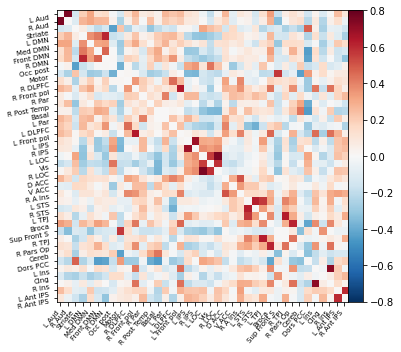

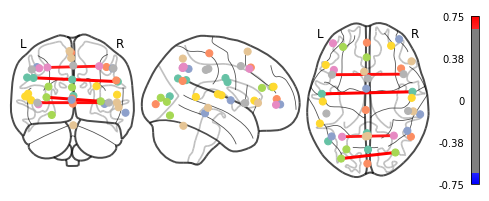

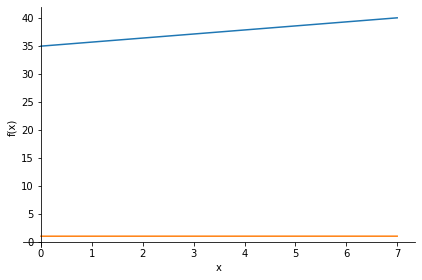

diplom/controls/MSDL/sub-OAS30071_ses-d0055_task-rest_run-2_atlas-MSDL.csv 54


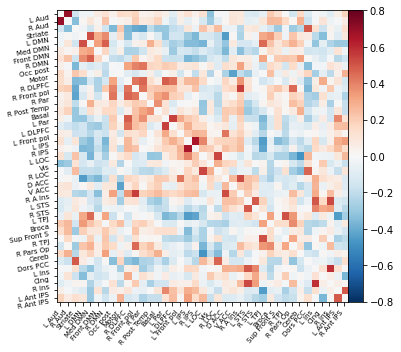

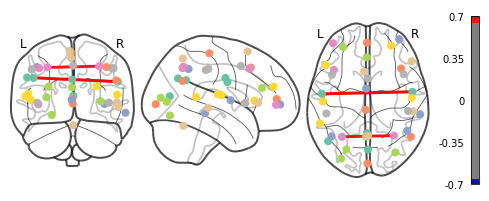

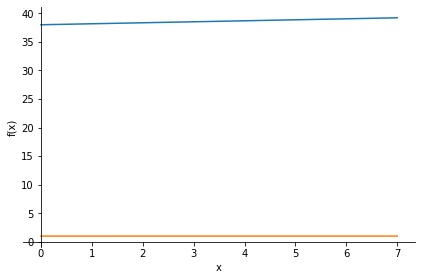

diplom/patients/MSDL/sub-OAS30896_ses-d0439_task-rest_run-1_atlas-MSDL.csv 55


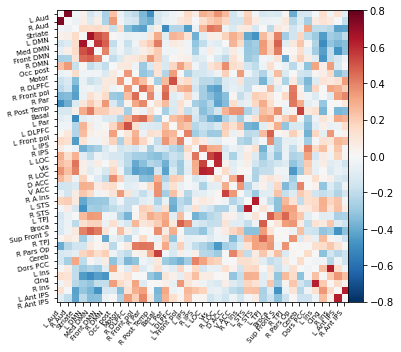

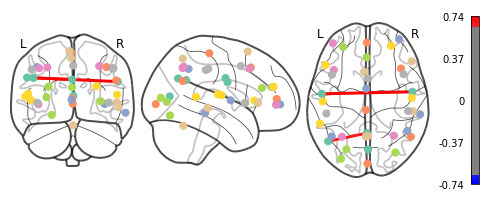

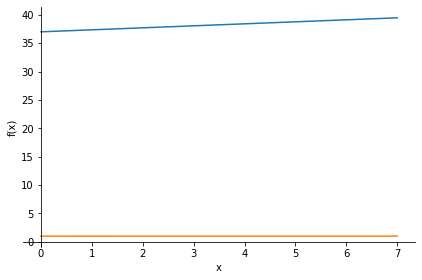

diplom/controls/MSDL/sub-OAS30414_ses-d0363_task-rest_run-1_atlas-MSDL.csv 55


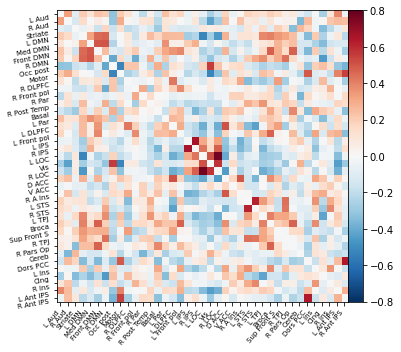

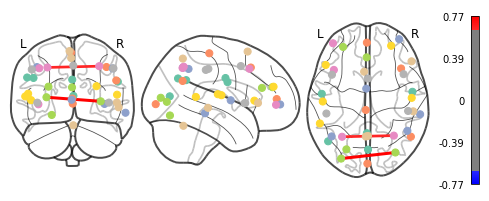

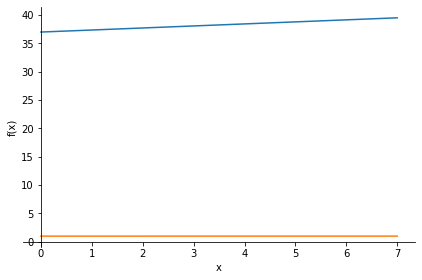

diplom/patients/MSDL/sub-OAS30313_ses-d0048_task-rest_run-2_atlas-MSDL.csv 56


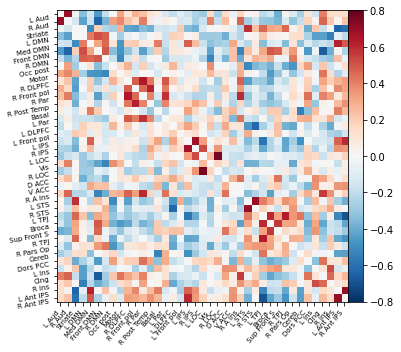

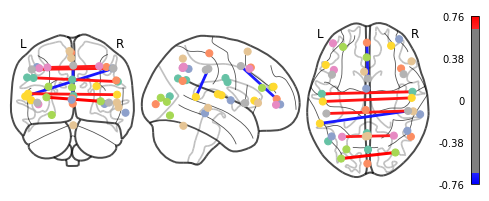

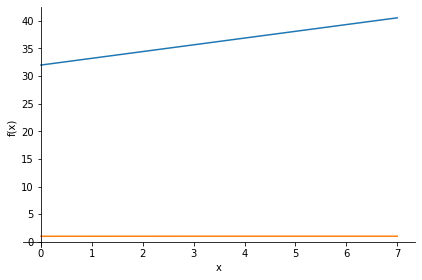

diplom/controls/MSDL/sub-OAS30324_ses-d0119_task-rest_run-2_atlas-MSDL.csv 56


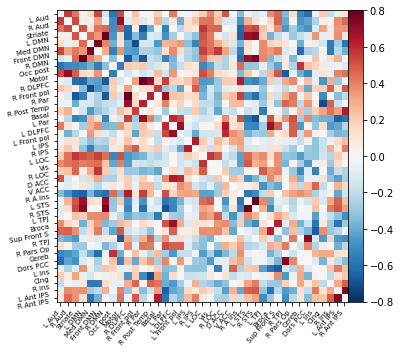

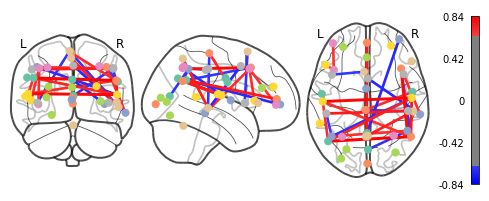

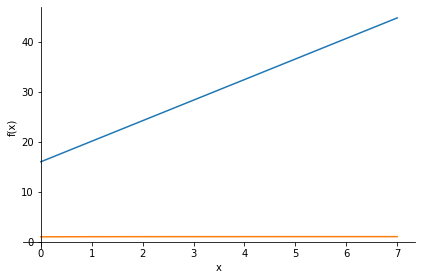

diplom/patients/MSDL/sub-OAS30707_ses-d0453_task-rest_run-1_atlas-MSDL.csv 57


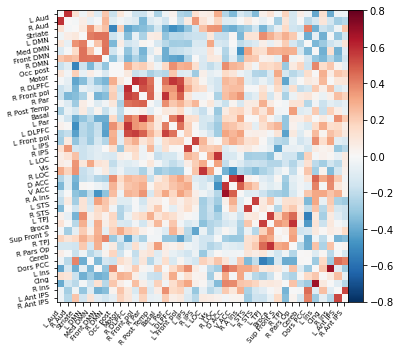

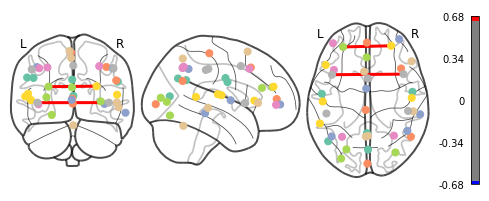

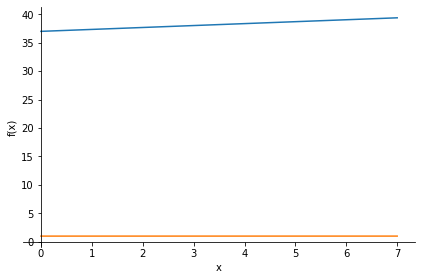

diplom/controls/MSDL/sub-OAS31059_ses-d3491_task-rest_run-2_atlas-MSDL.csv 57


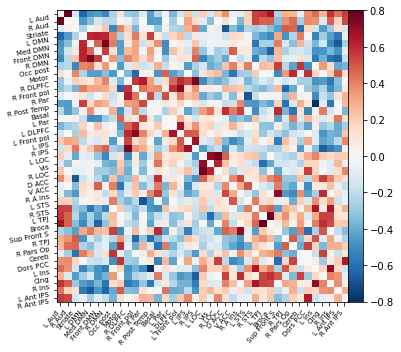

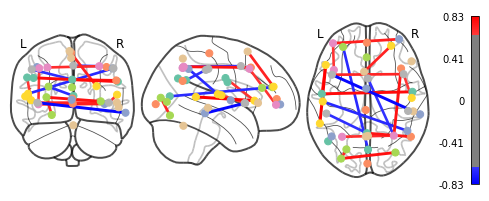

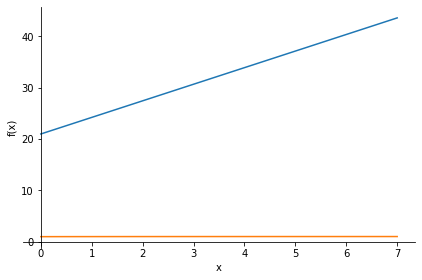

diplom/patients/MSDL/sub-OAS30597_ses-d1871_task-rest_run-1_atlas-MSDL.csv 58


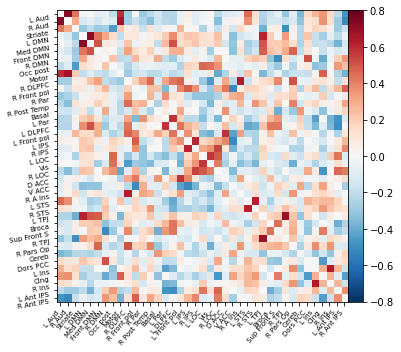

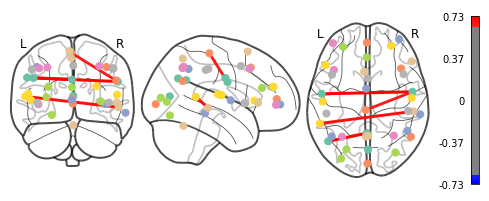

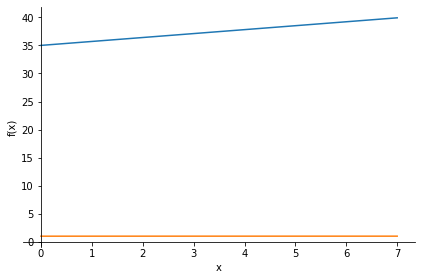

diplom/controls/MSDL/sub-OAS30007_ses-d0061_task-rest_run-2_atlas-MSDL.csv 58


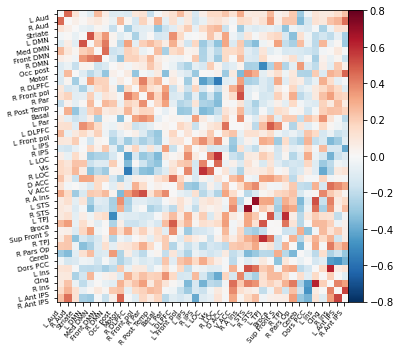

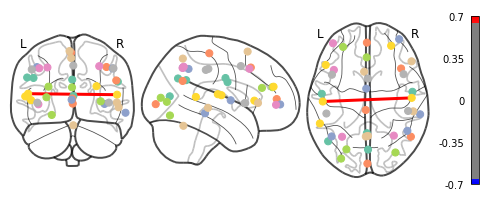

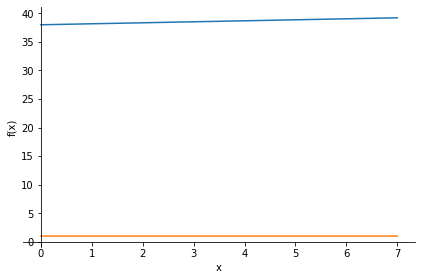

diplom/patients/MSDL/sub-OAS30505_ses-d5746_task-rest_run-1_atlas-MSDL.csv 59


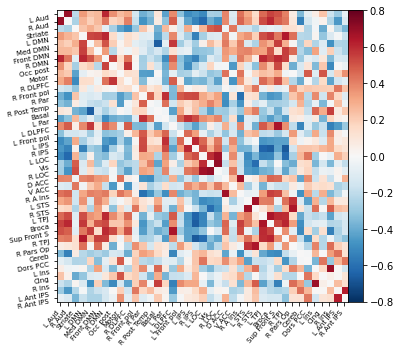

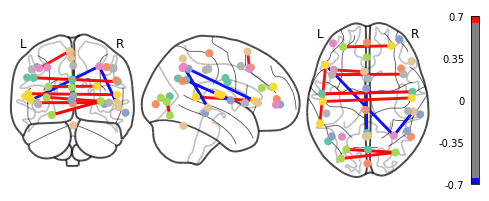

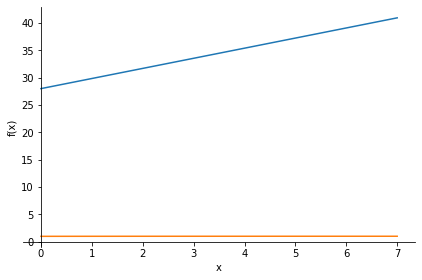

diplom/controls/MSDL/sub-OAS30907_ses-d0813_task-rest_run-1_atlas-MSDL.csv 59


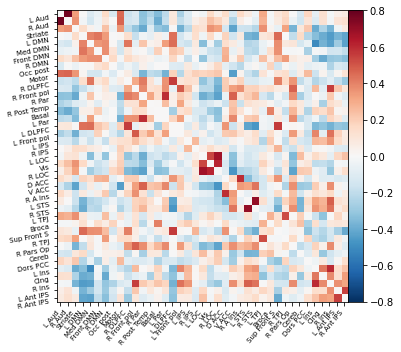

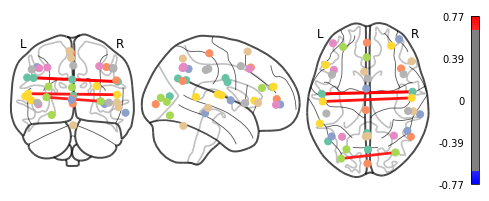

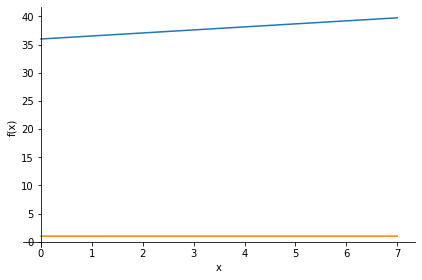

In [496]:
mag = []
spr = []
for i in range(60):
    m = 0
    print(list_patients[m + i], i)
    m1, s1 = ms_all_inclusive(str(list_patients[m + i]))
    mag.append(m1)
    spr.append(s1)
    print(list_controls[m + i], i)
    m2, s2 = ms_all_inclusive(str(list_controls[m + i]))
    mag.append(m2)
    spr.append(s2)

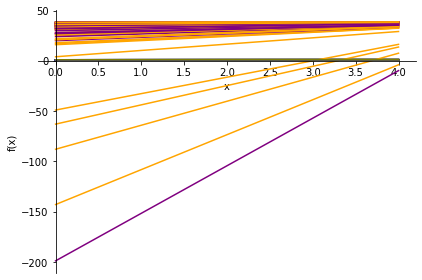

In [497]:
compare_graph(mag, spr)

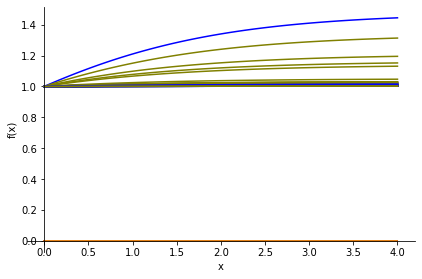

In [508]:
compare_graph(zer, spr)

In [500]:
def compare_graph_random(m,s):
    # четные -- пациенты, нечетные -- контроль
    scale = 4
    p1 = plot(m[0] ,(x, 0, scale), show=False)
    p2 = plot(s[0], (x, 0, scale), show=False)
    p1.append(p2[0])
    for i in range(len(m) - 1):
        if i%2==0: 
            p3 = plot(m[i + 1] ,(x, 0, scale), show=False, )
            p4 = plot(s[i + 1], (x, 0, scale), show=False, )
            p1.extend(p3)
            p1.extend(p4)
        else:
            p3 = plot(m[i + 1] ,(x, 0, scale), show=False,)
            p4 = plot(s[i + 1], (x, 0, scale), show=False,)
            p1.extend(p3)
            p1.extend(p4)
    p1.show()

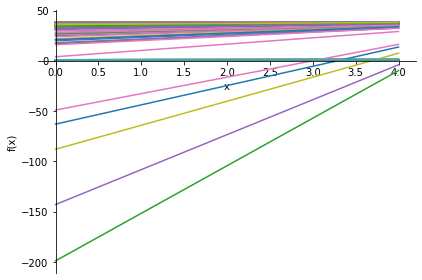

In [502]:
compare_graph_random(mag, spr)

In [503]:
mag[0]

0.17375*x + 38.0

In [504]:
len(mag)

120

In [507]:
zer = list(np.zeros(120))
zer[0]

0.0

In [509]:
len((mag[1::2]))

60

In [510]:
spr[0]

37/39 + 2/(38 + exp(-0.695*x))

In [511]:
Pow(Integral(Pow(spr[0],2), (x,0.5,5)), 0.5)

Integral((37/39 + 2/(38 + exp(-0.695*x)))**2, (x, 0.5, 5))**0.5

In [512]:
def metric_3(m,s):
    # среднее всех магнитуд и спредов, их разность
    l = len(m)
    sum_mag_pat = sum(m[::2]) / l
    sum_mag_con = sum(m[1::2]) / l
    sum_spr_pat = sum(s[::2]) / l
    sum_spr_con = sum(s[1::2]) / l
    comp_mag = sum_mag_pat - sum_mag_con
    comp_spr = sum_spr_pat - sum_spr_con
    scale = 4
    p1 = plot(comp_mag ,(x, 0, scale), show=False)
    p2 = plot(comp_spr, (x, 0, scale), show=False)
    p1.extend(p2)
    p1.show()

RecursionError: maximum recursion depth exceeded in __instancecheck__

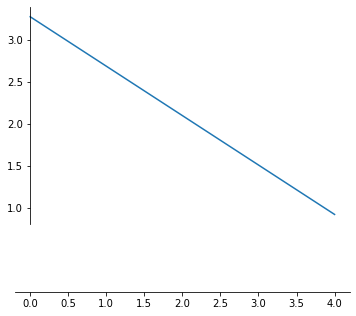

In [513]:
metric_3(mag,spr)

In [514]:
def metric_2(m,s):
    # среднее всех магнитуд, их кв разность, интег,корень
    l = len(m)
    sum_mag_pat = sum(m[::2]) / l
    sum_mag_con = sum(m[1::2]) / l
    sum_spr_pat = sum(s[::2]) / l
    sum_spr_con = sum(s[1::2]) / l
    comp_mag = Pow(integrate(Pow(sum_mag_pat - 
                                sum_mag_con, 2), x), 0.5)
    scale = 4
    p1 = plot(comp_mag ,(x, 0, scale), show=False)
    p1.show()

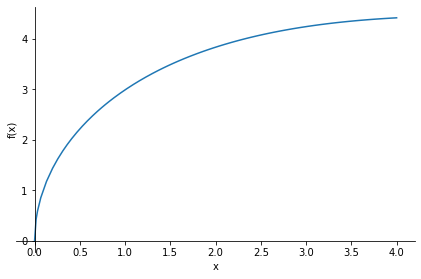

In [515]:
metric_2(mag,spr)

In [516]:
import sympy
from scipy.integrate import quad
from sympy.plotting.plot import List2DSeries

def calculate_definite_integral_values(f, x_0, x_1, steps=10):
    def f_numeric(x_val):
        return float(f.subs(x, x_val))
    X = []
    Y = []    
    x = sympy.Symbol('x')

    for x_ in np.linspace(x_0, x_1, steps):
        result, _ = quad(f_numeric, x_0, x_)
        X.append(x_)
        Y.append(result)
    return np.array(X), np.array(Y)

def metric_1(m,s):
    # среднее всех магнитуд и спредов, их кв разность, интег,корень
    l = len(m)
    scale = 4

    sum_mag_pat = sum(m[::2]) / l
    sum_mag_con = sum(m[1::2]) / l
    sum_spr_pat = sum(s[::2]) / l
    sum_spr_con = sum(s[1::2]) / l
    comp_mag = Pow(integrate(Pow(sum_mag_pat - 
                                sum_mag_con, 2), x), 0.5)
    f = Pow(sum_spr_pat - sum_spr_con, 2)
    X, Y = calculate_definite_integral_values(f, 0, scale)
    Y = Y ** 0.5
    p1 = plot(comp_mag ,(x, 0, scale), show=False)
    p2 = List2DSeries(X, Y)
    p1.append(p2)
    p1.show()

In [517]:
metric_1(mag,spr)

KeyboardInterrupt: 

In [ ]:
metric_1(zer,spr)

In [563]:
from sympy import Interval, maximum

def metric_2_cor(m, s, n_points=20, x_0=0, x_1=4):
    # среднее всех магнитуд, их кв разность, интег,корень
    # для спредов считаем корреляцию в n_points точках
    l = len(m)
    x = sympy.Symbol('x')
    xs = np.linspace(x_0, x_1, n_points)
    s_ys = np.zeros((l, n_points))
    
    for func_num in range(l):
        for point_num in range(n_points):
            s_ys[func_num, point_num] = s[func_num].subs(x, xs[point_num]).evalf()

    polinomial_correlation_m = np.zeros(shape=(l,l))
    polinomial_correlation_s = np.zeros(shape=(l,l))

    for i in range(l):
        for j in range(l):
            polinomial_correlation_m[i][j] = maximum(
                m[i] - m[j], x, Interval(0, 4)).doit()
            polinomial_correlation_s[i][j] = np.corrcoef(s_ys[i], s_ys[j])[0, 1]
            
    return polinomial_correlation_m, polinomial_correlation_s

In [564]:
mat_mag, mat_spr = metric_2_cor(mag,spr)

In [520]:
mat_mag_cor = np.round(mat_mag, 5)
mat_mag_cor

array([[21.   , 34.   , 13.   , ..., 17.   ,  0.   ,  2.   ],
       [17.   , 30.   ,  9.   , ..., 13.   , -1.272, -0.724],
       [21.   , 34.   , 13.   , ..., 17.   ,  0.04 ,  2.   ],
       ...,
       [20.   , 33.   , 12.   , ..., 16.   , -0.336,  1.   ],
       [18.   , 31.   , 10.   , ..., 14.   , -0.889, -0.341],
       [11.   , 24.   ,  3.   , ...,  7.   , -3.304, -2.756]])

In [565]:
np.shape(mat_mag)

(120, 120)

In [530]:
mat_mag_cor[3:]

array([[-42.439, -38.91 , -44.875, ..., -43.71 , -48.487, -47.939],
       [ 10.   ,  23.   ,   2.   , ...,   6.   ,  -2.828,  -2.28 ],
       [ 20.   ,  33.   ,  12.   , ...,  16.   ,  -0.324,   1.   ],
       ...,
       [ 20.   ,  33.   ,  12.   , ...,  16.   ,  -0.336,   1.   ],
       [ 18.   ,  31.   ,  10.   , ...,  14.   ,  -0.889,  -0.341],
       [ 11.   ,  24.   ,   3.   , ...,   7.   ,  -3.304,  -2.756]])

In [531]:
mat_mag_cor[3]

array([-42.439, -38.91 , -44.875, -42.426, -47.37 , -47.869, -48.526,
       -47.787, -45.623, -47.562, -47.205, -43.845, -48.483,  -5.802,
       -48.497, -46.635, -44.747, -48.227, -48.533, -43.946, -46.627,
       -47.833, -47.182, -48.213, -48.14 , -47.471, -47.804, -47.822,
       -46.52 , -48.497, -47.607, -48.33 , -23.462, -47.823, -47.712,
       -48.463, -46.869, -46.41 , -46.32 , -47.625, -46.045, -47.806,
       -48.144, -46.362, -47.216, -46.86 , -47.444, -48.145, -46.508,
       -17.322, -47.26 , -26.127, -47.864, -48.554, -48.486, -48.225,
       -42.225, -43.71 , -48.487, -47.939])

In [532]:
mat_mag_cor[2]

array([2.10e+01, 3.40e+01, 1.30e+01, 2.00e+01, 4.00e+00, 2.00e+00,
       1.00e-03, 2.00e+00, 1.00e+01, 3.00e+00, 4.00e+00, 1.70e+01,
       4.40e-02, 1.81e+02, 3.00e-02, 7.00e+00, 1.20e+01, 1.00e+00,
       0.00e+00, 1.60e+01, 6.00e+00, 3.00e+00, 5.00e+00, 1.00e+00,
       1.00e+00, 4.00e+00, 2.00e+00, 2.00e+00, 6.00e+00, 3.00e-02,
       3.00e+00, 1.00e+00, 1.01e+02, 3.00e+00, 3.00e+00, 6.40e-02,
       5.00e+00, 7.00e+00, 7.00e+00, 3.00e+00, 8.00e+00, 2.00e+00,
       1.00e+00, 7.00e+00, 4.00e+00, 6.00e+00, 3.00e+00, 1.00e+00,
       6.00e+00, 1.26e+02, 4.00e+00, 8.70e+01, 2.00e+00, 0.00e+00,
       4.10e-02, 1.00e+00, 2.20e+01, 1.70e+01, 4.00e-02, 2.00e+00])

In [533]:
mat_mag_expelled = mat_mag_cor
mat_mag_expelled[3] = mat_mag_cor[2]


In [561]:
np.shape(mat_mag_expelled)

(60, 60)

In [ ]:
mag_test = mat_mag_expelled[:]

In [534]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(mat_mag_expelled)
kmeans

KMeans(n_clusters=2, n_init='auto', random_state=0)

In [535]:
kmeans.labels_

array([1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1,
       0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0], dtype=int32)

In [559]:
predictions = kmeans.predict(mat_mag_expelled)

In [560]:
predictions

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int32)

In [ ]:
condition positive (P)
the number of real positive cases in the data
condition negative (N)
the number of real negative cases in the data
true positive (TP)
A test result that correctly indicates the presence of a condition or characteristic
true negative (TN)
A test result that correctly indicates the absence of a condition or characteristic
false positive (FP)
A test result which wrongly indicates that a particular condition or attribute is present
false negative (FN)
A test result which wrongly indicates that a particular condition or attribute is absent

In [556]:
kmeans_result = np.array(kmeans.labels_)
kmean_mat = mat_mag_expelled
tp,tn,fp,fn = 0,0,0,0
for i in range(len(kmean_mat)):
    
    kmeans.predict([[0, 0], [12, 3]])
    
    if i%2==0: # patient with Alzheimer
        if kmeans_result[i]== 1: # patient positive
            fn +=1
        elif kmeans_result[i]== 0: # patient negative
            tp +=1 
    elif i%2==1: # patient with no Alzheimer
        if kmeans_result[i]== 1: # patient positive
            fp +=1
        elif kmeans_result[i]== 0: # patient negative
            tn +=1   

In [557]:
print(tp,tn,fp,fn)

20 18 12 10


In [ ]:
sensitivity, recall, hit rate, or true positive rate (TPR)
tp / p

In [ ]:
tpr = 20

In [ ]:
maximize tp and tn 

In [571]:
from sympy import Interval, maximum
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score

def compute_spread_values(sp, x_0=0, x_1=4, n_points=20):
    x = sympy.Symbol('x')
    xs = np.linspace(x_0, x_1, n_points)
    s_ys = np.zeros(n_points)
    for point_num in range(n_points):
        s_ys[point_num] = sp.subs(x, xs[point_num]).evalf()
    return s_ys

def kernel_spr(X, Y=None):
    if len(X.shape) != 2:
        X = X[None, :]
    if len(Y.shape) != 2:
        Y = Y[None, :]
    if Y is None:
        corcoeffs = np.corrcoef(X)
    else:
        l1 = len(X)
        corcoeffs = np.corrcoef(X, Y)
        corcoeffs = corcoeffs[:l1, l1:]
    return np.exp(-corcoeffs)

y = np.array([0, 1] * 60)
X = np.array([compute_spread_values(sp) for sp in spr])
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=5)

knn = KNeighborsClassifier(metric=kernel_spr, n_neighbors=5)
knn.fit(X_train, y_train)
print("Train data:")
print(classification_report(y_train, knn.predict(X_train)))
train_auc = roc_auc_score(y_train, knn.predict(X_train))
print(f"Train roc auc: {train_auc:.2f}")
print("Test data:")
print(classification_report(y_test, knn.predict(X_test)))
test_auc = roc_auc_score(y_test, knn.predict(X_test))
print(f"Test roc auc: {test_auc:.2f}")

Train data:
              precision    recall  f1-score   support

           0       0.68      0.78      0.73        46
           1       0.73      0.61      0.67        44

    accuracy                           0.70        90
   macro avg       0.70      0.70      0.70        90
weighted avg       0.70      0.70      0.70        90

Train roc auc: 0.70
Test data:
              precision    recall  f1-score   support

           0       0.58      0.79      0.67        14
           1       0.73      0.50      0.59        16

    accuracy                           0.63        30
   macro avg       0.65      0.64      0.63        30
weighted avg       0.66      0.63      0.63        30

Test roc auc: 0.64


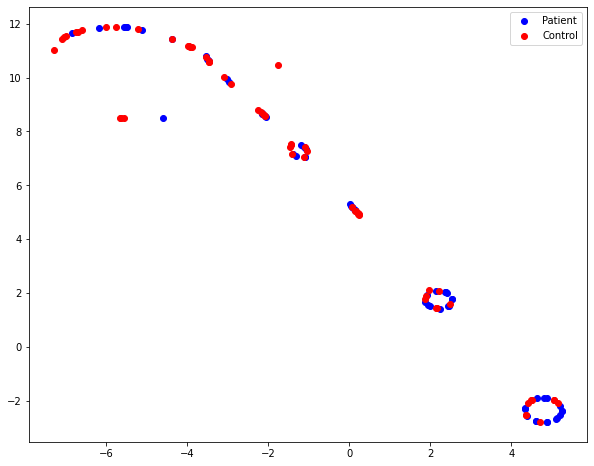

In [579]:
from sklearn.manifold import TSNE
from matplotlib import pyplot as plt


tsne = TSNE(random_state=1)
X_tsne = tsne.fit_transform(X)
plt.figure(figsize=(10, 8))
plt.scatter(X_tsne[y==0, 0], X_tsne[y==0, 1], color='blue', label='Patient')
plt.scatter(X_tsne[y==1, 0], X_tsne[y==1, 1], color='red', label='Control')
plt.legend()

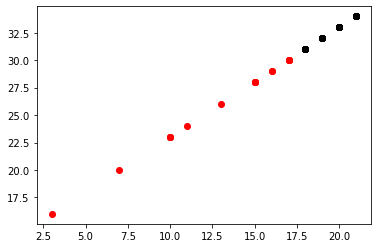

In [536]:
import matplotlib.pyplot as plt

label = kmeans.fit_predict(mat_mag_expelled)
 
#filter rows of original data
filtered_label0 = mat_mag_cor[label == 0]
filtered_label1 = mat_mag_cor[label == 1]

#Plotting the results
plt.scatter(filtered_label0[:,0] , filtered_label0[:,1],
            color = 'red')
plt.scatter(filtered_label1[:,0] , filtered_label1[:,1],
            color = 'black')
plt.show()

In [549]:
kmeans_spr = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(mat_spr_expelled)
kmeans_spr

KMeans(n_clusters=2, n_init='auto', random_state=0)

In [550]:
kmeans_spr.labels_

array([0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1,
       0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1], dtype=int32)

In [552]:
np.shape(kmeans_spr.labels_)

(60,)

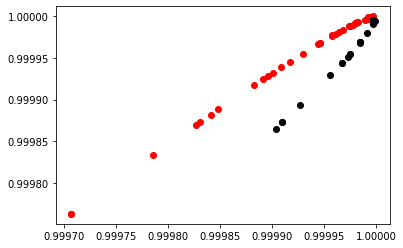

In [551]:
import matplotlib.pyplot as plt

label = kmeans.fit_predict(mat_spr_expelled)
 
#filter rows of original data
filtered_label0 = mat_spr[label == 0]
filtered_label1 = mat_spr[label == 1]

#Plotting the results
plt.scatter(filtered_label0[:,0] , filtered_label0[:,1],
            color = 'red')
plt.scatter(filtered_label1[:,0] , filtered_label1[:,1],
            color = 'black')
plt.show()

In [576]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score

def compute_magnitude_values(sp, x_0=0, x_1=4):
    x = sympy.Symbol('x')
    s_ys = np.zeros(2)
    s_ys[0] = sp.subs(x, x_0).evalf()
    s_ys[1] = sp.subs(x, x_1).evalf()
    return s_ys

y_mag = np.array([0, 1] * 60)
X_mag = np.array([compute_magnitude_values(mg) for mg in mag])
X_train_mag, X_test_mag, y_train_mag, y_test_mag = train_test_split(X_mag, y_mag, random_state=6)
knn_mag = KNeighborsClassifier(metric="l2", n_neighbors=5)
knn_mag.fit(X_train_mag, y_train_mag)
print("Train data:")
print(classification_report(y_train_mag, knn_mag.predict(X_train_mag)))
train_auc_mag = roc_auc_score(y_train_mag, knn_mag.predict(X_train_mag))
print(f"Train roc auc: {train_auc_mag:.2f}")
print("Test data:")
print(classification_report(y_test_mag, knn_mag.predict(X_test_mag)))
test_auc_mag = roc_auc_score(y_test_mag, knn_mag.predict(X_test_mag))
print(f"Test roc auc: {test_auc_mag:.2f}")

Train data:
              precision    recall  f1-score   support

           0       0.74      0.69      0.72        42
           1       0.75      0.79      0.77        48

    accuracy                           0.74        90
   macro avg       0.74      0.74      0.74        90
weighted avg       0.74      0.74      0.74        90

Train roc auc: 0.74
Test data:
              precision    recall  f1-score   support

           0       0.62      0.44      0.52        18
           1       0.41      0.58      0.48        12

    accuracy                           0.50        30
   macro avg       0.51      0.51      0.50        30
weighted avg       0.53      0.50      0.50        30

Test roc auc: 0.51


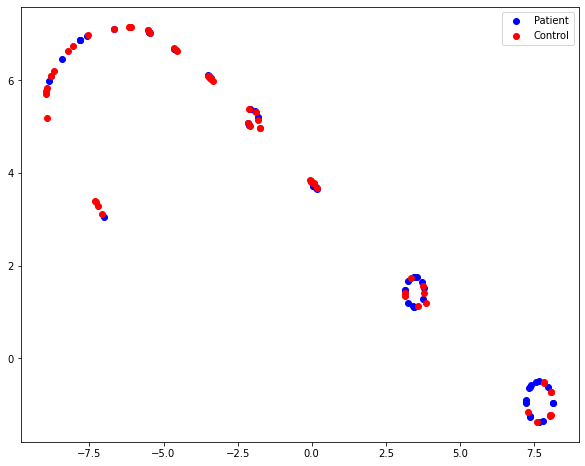

In [580]:
from sklearn.manifold import TSNE
from matplotlib import pyplot as plt


tsne_mag = TSNE(random_state=1)
X_tsne_mag = tsne_mag.fit_transform(X_mag)
plt.figure(figsize=(10, 8))
plt.scatter(X_tsne_mag[y_mag==0, 0], X_tsne_mag[y_mag==0, 1], color='blue', label='Patient')
plt.scatter(X_tsne_mag[y_mag==1, 0], X_tsne_mag[y_mag==1, 1], color='red', label='Control')
plt.legend()

In [364]:
l = len(mag)

In [365]:
l

60